In [1]:
import os
import warnings
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from pycaret.classification import *
from catboost import Pool, CatBoostClassifier, EShapCalcType, EFeaturesSelectionAlgorithm
import shap
import optuna
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import f1_score, make_scorer
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier
from imblearn.pipeline import Pipeline
from scipy.stats import chi2_contingency
from statsmodels.tools.tools import add_constant
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore') # Suppress warnings

In [2]:
RANDOM_STATE = 110

# Load data
train_df = pd.read_csv("train_new.csv")
test_df = pd.read_csv("test_new.csv")

In [3]:
# 필요없는 컬럼 삭제
test_df = test_df.drop(['Set ID', 'target'], axis=1)

In [4]:
# 모든 값이 결측값인 컬럼을 제거하는 함수
def remove_all_missing_columns(data):
    # 결측값이 모든 행에 있는 컬럼만 True로 표시됩니다.
    is_all_missing = data.isnull().all()
    # True가 아닌 컬럼만 선택하여 데이터프레임을 새로 생성합니다.
    cleaned_data = data.loc[:, ~is_all_missing]
    return cleaned_data

# train_data와 test_data에 함수 적용
train_df = remove_all_missing_columns(train_df)
test_df = remove_all_missing_columns(test_df)

In [5]:
# OK값이 있는 컬럼 중 필요없는 컬럼 제거
columns_to_remove = [
    "HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam",
    "GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave",
    "HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1",
    "HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2"
]

# train_data에서 컬럼 제거
train_df.drop(columns=columns_to_remove, errors='ignore', inplace=True)

# test_data에서 컬럼 제거
test_df.drop(columns=columns_to_remove, errors='ignore', inplace=True)


In [6]:
# OK값이 있는 컬럼 중 필요한 컬럼 처리
# "OK" 값을 1로 변경
train_df['GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave'].replace('OK', 1, inplace=True)
test_df['GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave'].replace('OK', 1, inplace=True)

# 결측값을 0으로 채우기
train_df['GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave'].fillna(0, inplace=True)
test_df['GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave'].fillna(0, inplace=True)

### unique data가 1개인 컬럼 출력

In [7]:
# unique data가 1개 이하만 들어있는 컬럼
unique_counts = train_df.nunique()
tr_cols_to_drop = unique_counts[unique_counts <= 1].index

# unique data가 1개 이하만 들어있는 컬럼 출력
print("unique data가 1개 이하인 train_df 컬럼:")
print(tr_cols_to_drop)
print()

# 검증: unique data의 개수 출력
unique_counts = train_df[tr_cols_to_drop].nunique()
print("각 컬럼별 unique data의 개수:")
print(unique_counts)

unique data가 1개 이하인 train_df 컬럼:
Index(['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam',
       'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam',
       'CURE STANDBY POSITION Z Collect Result_Dam',
       'CURE STANDBY POSITION Θ Collect Result_Dam',
       'CURE START POSITION Z Collect Result_Dam',
       'HEAD Standby Position X Collect Result_Dam',
       'HEAD Standby Position Y Collect Result_Dam',
       'HEAD Standby Position Z Collect Result_Dam',
       'Head Clean Position X Collect Result_Dam',
       'Head Clean Position Y Collect Result_Dam',
       'Head Purge Position X Collect Result_Dam',
       'Head Purge Position Y Collect Result_Dam',
       'Head Zero Position X Collect Result_Dam',
       'WorkMode Collect Result_Dam', 'Wip Line_AutoClave',
       'Process Desc._AutoClave', 'Equipment_AutoClave',
       'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave',
       '1st Pressure Judge Value_AutoClave',
       '2nd Pressure Judge Valu

In [8]:
# unique data가 1개 이하만 들어있는 컬럼
unique_counts = test_df.nunique()
te_cols_to_drop = unique_counts[unique_counts <= 1].index

# unique data가 1개 이하만 들어있는 컬럼 출력
print("unique data가 1개 이하인 test_df 컬럼:")
print(te_cols_to_drop)
print()

# 검증: unique data의 개수 출력
unique_counts = test_df[te_cols_to_drop].nunique()
print("각 컬럼별 unique data의 개수:")
print(unique_counts)

unique data가 1개 이하인 test_df 컬럼:
Index(['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam',
       'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam',
       'CURE STANDBY POSITION Z Collect Result_Dam',
       'CURE STANDBY POSITION Θ Collect Result_Dam',
       'CURE START POSITION Z Collect Result_Dam',
       'HEAD Standby Position X Collect Result_Dam',
       'HEAD Standby Position Y Collect Result_Dam',
       'HEAD Standby Position Z Collect Result_Dam',
       'Head Clean Position X Collect Result_Dam',
       'Head Clean Position Y Collect Result_Dam',
       'Head Purge Position X Collect Result_Dam',
       'Head Purge Position Y Collect Result_Dam',
       'Head Zero Position X Collect Result_Dam',
       'WorkMode Collect Result_Dam', 'Wip Line_AutoClave',
       'Process Desc._AutoClave', 'Equipment_AutoClave',
       'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave',
       '1st Pressure Judge Value_AutoClave',
       '2nd Pressure Judge Value

### unique data가 1개 이하인 컬럼 삭제

In [9]:
# 결과 출력
print("삭제 전 columns 개수 출력:")
print(len(train_df.columns))
print(len(test_df.columns))

# 1개 이하만 들어있는 컬럼 삭제
train_df = train_df.drop(columns=tr_cols_to_drop)
test_df  = test_df.drop(columns=te_cols_to_drop)

# 결과 출력
print("삭제 후 columns 개수 출력:")
print(len(train_df.columns))
print(len(test_df.columns))

삭제 전 columns 개수 출력:
182
181
삭제 후 columns 개수 출력:
120
119


## 동일해야하는 변수 찾고 제거하기

In [10]:
# Equipment_Dam 컬럼에서 #1을 포함하는 값은 0으로, #2를 포함하는 값은 1로 변환
def convert_equipment_values(row):
    if '#1' in str(row):
        return 0
    elif '#2' in str(row):
        return 1
    return row  # #1 또는 #2를 포함하지 않는 경우 원래 값 유지

train_df['Equipment_Dam'] = train_df['Equipment_Dam'].apply(convert_equipment_values)
train_df['Equipment_Fill1'] = train_df['Equipment_Fill1'].apply(convert_equipment_values)
train_df['Equipment_Fill2'] = train_df['Equipment_Fill2'].apply(convert_equipment_values)

test_df['Equipment_Dam'] = test_df['Equipment_Dam'].apply(convert_equipment_values)
test_df['Equipment_Fill1'] = test_df['Equipment_Fill1'].apply(convert_equipment_values)
test_df['Equipment_Fill2'] = test_df['Equipment_Fill2'].apply(convert_equipment_values)

In [11]:
# 컬럼 그룹 정의
equipment_cols = ['Equipment_Dam', 'Equipment_Fill1', 'Equipment_Fill2']
model_suffix_cols = [col for col in train_df.columns if "Model.Suffix" in col]
workorder_cols = [col for col in train_df.columns if "Workorder" in col]
receip_no_cols = [col for col in train_df.columns if "Receip No Collect Result" in col]
pallet_id_cols = [col for col in train_df.columns if "PalletID" in col]
production_qty_cols = [col for col in train_df.columns if "Production" in col]

# 주어진 컬럼 그룹에서 서로 다른 값을 찾는 함수
def find_differences(data, columns):
    if not columns:
        return []  # 주어진 컬럼 그룹이 비어있는 경우 빈 리스트 반환
    comparison_df = data[columns]
    diff_rows = comparison_df[comparison_df.nunique(axis=1) > 1]  # 행별로 유일한 값의 수를 계산, 1보다 크면 다름
    return diff_rows.index.tolist()  # 차이가 있는 행의 인덱스를 리스트로 반환

# 데이터에 대한 일관성 검사 실행
def check_consistency(data, columns_groups):
    all_inconsistent_indices = set()  # 중복 제거를 위한 집합 생성
    for key, cols in columns_groups.items():
        inconsistent_indices = find_differences(data, cols)
        all_inconsistent_indices.update(inconsistent_indices)  # 집합에 인덱스 추가(자동으로 중복 제거됨)
        print(f"Differences in {key} columns:\n", inconsistent_indices)
    
    all_inconsistent_indices = sorted(list(all_inconsistent_indices))  # 리스트로 변환 후 정렬
    print(f"\nTotal number of inconsistent rows: {len(all_inconsistent_indices)}")
    return all_inconsistent_indices

# 컬럼 그룹을 딕셔너리로 관리
columns_groups = {
    'Model Suffix': model_suffix_cols,
    'Workorder': workorder_cols,
    'Receip No': receip_no_cols,
    'Pallet ID': pallet_id_cols,
    'Production Qty': production_qty_cols,
    'Equipment': equipment_cols  # 추가된 그룹
}

# Train data와 Test data에 대해 일관성 검사 실행
print("Checking consistency in train_df:")
inconsistent_indices = check_consistency(train_df, columns_groups)

# 최종 일관성 검사가 통과되지 않은 행의 인덱스들을 출력
print("Inconsistent indices across all groups:", inconsistent_indices)


Checking consistency in train_df:
Differences in Model Suffix columns:
 []
Differences in Workorder columns:
 []
Differences in Receip No columns:
 [2766, 8878, 37520, 37788]
Differences in Pallet ID columns:
 [137, 1079, 1832, 2118, 2164, 2544, 2724, 2808, 3251, 3364, 4028, 4277, 4787, 5102, 5437, 5561, 5922, 6485, 6531, 6560, 6563, 6860, 7471, 7798, 8066, 8555, 9081, 9724, 10007, 10314, 10410, 12736, 12980, 13009, 13028, 14452, 15612, 17078, 17503, 17926, 18190, 18868, 18941, 20194, 20754, 20920, 21339, 21443, 21812, 21841, 21933, 21967, 22068, 22309, 22804, 24006, 24876, 25344, 25525, 25635, 27170, 27445, 27472, 28349, 28371, 28409, 30187, 31191, 31260, 31640, 32124, 32946, 33477, 34236, 34572, 34915, 35599, 36534, 36582, 37520, 37886, 38377, 39245]
Differences in Production Qty columns:
 [137, 1079, 1832, 2118, 2164, 2544, 2724, 2766, 2808, 3251, 3364, 4028, 4277, 4787, 5102, 5437, 5561, 5922, 6485, 6531, 6560, 6563, 6860, 7471, 7798, 8066, 8537, 8555, 8878, 9081, 9724, 10007, 1031

In [12]:
inconsistent_indices_test = check_consistency(test_df, columns_groups)
inconsistent_indices_test

Differences in Model Suffix columns:
 []
Differences in Workorder columns:
 []
Differences in Receip No columns:
 []
Differences in Pallet ID columns:
 [64, 562, 1460, 1530, 1892, 2505, 2710, 3457, 3682, 4932, 7001, 7287, 7666, 7836, 8253, 8898, 10989, 12439, 12585, 12844, 14756, 15180, 15406, 15811, 15964]
Differences in Production Qty columns:
 [64, 562, 1460, 1530, 1892, 2505, 2710, 3457, 3682, 3732, 4928, 4932, 6092, 7001, 7287, 7666, 7836, 8253, 8898, 10989, 12439, 12585, 12844, 14756, 15180, 15406, 15811, 15964]
Differences in Equipment columns:
 [562, 3457, 7287, 7836, 8253, 8898, 10989, 12439, 15180, 15406, 15811, 15964]

Total number of inconsistent rows: 28


[64,
 562,
 1460,
 1530,
 1892,
 2505,
 2710,
 3457,
 3682,
 3732,
 4928,
 4932,
 6092,
 7001,
 7287,
 7666,
 7836,
 8253,
 8898,
 10989,
 12439,
 12585,
 12844,
 14756,
 15180,
 15406,
 15811,
 15964]

In [13]:
# 행 제거 함수
def find_differences_row(data, columns):
    if not columns:
        return None  # 주어진 컬럼 그룹이 비어있는 경우 None 반환
    comparison_df = data[columns]
    diff_rows = comparison_df[comparison_df.nunique(axis=1) > 1]  # 행별로 유일한 값의 수를 계산, 1보다 크면 다름
    return diff_rows
    
def remove_inconsistent_rows(data, columns_groups):
    for key, cols in columns_groups.items():
        diff_rows = find_differences_row(data, cols)
        if diff_rows is not None:
            data.drop(diff_rows.index, inplace=True)
    return data

train_df = remove_inconsistent_rows(train_df, columns_groups)

## 제거할 변수(모든 공정에서 동일해야하는 컬럼. => 동일하지 않은 컬럼은 제거 후 진행 해야함)
- Model.Suffix(DAM 제외)
- PalletID (DAM 제외)
- Workorder(DAM 제외)
- Production Qty(DAM제외)
- Receip No(DAM제외)

In [14]:
remove_cols = ['Model.Suffix_AutoClave', 'Model.Suffix_Fill1', 'Model.Suffix_Fill2', 
               'Equipment_Fill1', 'Equipment_Fill2',
               'Workorder_AutoClave', 'Workorder_Fill1', 'Workorder_Fill2',
               'Receip No Collect Result_Fill1', 'Receip No Collect Result_Fill2',
               'Production Qty Collect Result_Fill1', 'Production Qty Collect Result_Fill2',
               'PalletID Collect Result_Fill1','PalletID Collect Result_Fill2']

# 결과 출력
print("삭제 전 columns 개수 출력:")
print(len(train_df.columns))
print(len(test_df.columns))

# 삭제
train_df = train_df.drop(columns=remove_cols)
test_df  = test_df.drop(columns=remove_cols)

# 결과 출력
print("삭제 후 columns 개수 출력:")
print(len(train_df.columns))
print(len(test_df.columns))

삭제 전 columns 개수 출력:
120
119
삭제 후 columns 개수 출력:
106
105


## Equipment_Dam을 기준으로 0일때 unique 가 1개 and 1일때 unique가 1개인 컬럼은 제거

In [15]:
def remove_single_value_columns(df):
    # Equipment_Dam 값에 따른 데이터 분할
    group_0 = df[df['Equipment_Dam'] == 0]
    group_1 = df[df['Equipment_Dam'] == 1]

    # 유니크한 값이 1인 컬럼을 찾고 제거하는 함수
    def find_single_value_columns(data):
        columns_to_remove = []
        for col in data.columns:
            # Equipment_Dam 컬럼은 제외
            if col != 'Equipment_Dam' and len(data[col].unique()) == 1:
                columns_to_remove.append(col)
        return columns_to_remove

    # 각 그룹에 대해 유니크한 값이 1인 컬럼 찾기
    columns_to_remove_0 = find_single_value_columns(group_0)
    columns_to_remove_1 = find_single_value_columns(group_1)

    # 두 그룹에서 공통으로 제거할 컬럼 찾기
    common_columns_to_remove = list(set(columns_to_remove_0) & set(columns_to_remove_1))

    # 공통 컬럼 제거
    return df.drop(columns=common_columns_to_remove, inplace=False), common_columns_to_remove

# Train data와 Test data에서 일관성 없는 행 제거
train_df, train_removed_cols = remove_single_value_columns(train_df)
test_df, test_removed_cols = remove_single_value_columns(test_df)

print("Removed columns from train_df:", train_removed_cols)


Removed columns from train_df: ['CURE END POSITION X Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2', 'CURE END POSITION Θ Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2', 'CURE START POSITION Θ Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill2', 'CURE START POSITION X Collect Result_Dam', 'CURE END POSITION Z Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2']


In [16]:
columns_to_remove = [
    'CURE START POSITION Θ Collect Result_Dam', 'CURE END POSITION X Collect Result_Dam', 
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2', 
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2', 
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill2', 
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill2', 'CURE END POSITION Θ Collect Result_Dam', 
    'CURE START POSITION X Collect Result_Dam', 'CURE END POSITION Z Collect Result_Dam'
]

# test_df에서 해당 컬럼들을 제거
test_df = test_df.drop(columns=columns_to_remove, errors='ignore')

# 결과 확인
print("Columns after removal:", test_df.columns)

Columns after removal: Index(['Equipment_Dam', 'Model.Suffix_Dam', 'Workorder_Dam',
       'CURE SPEED Collect Result_Dam',
       'DISCHARGED SPEED OF RESIN Collect Result_Dam',
       'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
       'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
       'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
       'Dispense Volume(Stage1) Collect Result_Dam',
       'Dispense Volume(Stage2) Collect Result_Dam',
       'Dispense Volume(Stage3) Collect Result_Dam',
       'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
       'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
       'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
       'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
       'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
       'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
       'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
       

In [17]:
print(len(train_df.columns))
print(len(test_df.columns))

94
93


In [3]:
def data_ana(data, col_name):
    %matplotlib inline
    sns.set(font_scale=0.5)
    
    # unique 확인
    print('+++' * 3, 'unique 확인', '+++' * 3)
    print(data[col_name].value_counts(dropna=False))

    # 시각화 확인
    print('\n', '+++' * 3, '시각화', '+++' * 3)
    plt.figure(figsize=(4, 2))
    
    if pd.api.types.is_numeric_dtype(data[col_name]):
        sns.histplot(data[col_name], kde=True)
    else:
        sns.countplot(y=data[col_name])
    
    plt.tight_layout()
    plt.show()

    # normal, abnormal 별로 확인
    if col_name != 'target':
        grouped = data.groupby(['target', col_name]).size()
        proportion = grouped / grouped.groupby(level=0).sum()
        proportion_df = proportion.reset_index(name='Proportion')
        pivot_df = proportion_df.pivot(index=col_name, columns='target', values='Proportion').fillna(0)
        print('\n', '+++' * 3, 'unique 확인 / target 별', '+++' * 3)
        print(pivot_df)

        # 범주형 변수의 X축 순서를 동일하게 설정
        if not pd.api.types.is_numeric_dtype(data[col_name]):
            category_order = data[col_name].value_counts().index.tolist()
        else:
            category_order = None

        # Normal, AbNormal 별로 시각화
        for target_value in ['Normal', 'AbNormal']:
            plt.figure(figsize=(4, 2))
            if pd.api.types.is_numeric_dtype(data[col_name]):
                sns.histplot(data[data['target'] == target_value][col_name], kde=True)
                plt.title(f'Distribution of {col_name} for {target_value}')
                plt.xlabel(col_name)
                plt.ylabel('Frequency')
            else:
                category_counts = data[data['target'] == target_value][col_name].value_counts().reindex(category_order).reset_index()
                category_counts.columns = ['category', 'count']  # 열 이름 변경
                sns.barplot(x='category', y='count', data=category_counts, alpha=0.7, order=category_order)
                plt.title(f'Bar Plot of {col_name} for {target_value}')
                plt.ylabel('Count')
                plt.xlabel(col_name)
            
            plt.tight_layout()
            plt.show()


+++++++++ unique 확인 +++++++++
Head Purge Position Z Collect Result_Fill2
85.000     35480
114.612     5026
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


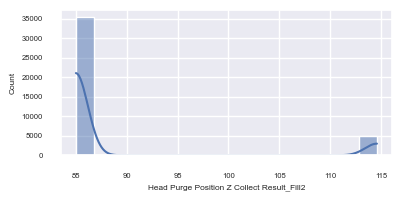


 +++++++++ unique 확인 / target 별 +++++++++
target                                      AbNormal    Normal
Head Purge Position Z Collect Result_Fill2                    
85.000                                      0.886383  0.875275
114.612                                     0.113617  0.124725


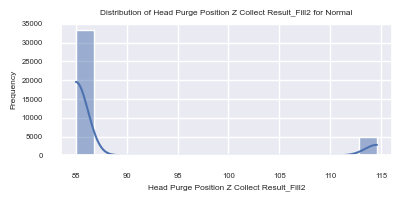

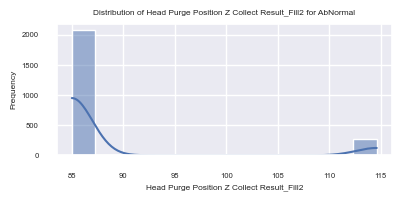

In [7]:
data_ana(train_df, 'Head Purge Position Z Collect Result_Fill2')

In [19]:
def remove_highly_correlated_features(corr_matrix, dataframe, threshold=0.9):
    # 절대값이 임계값을 넘는 상관관계만 선택
    corr_matrix = corr_matrix.abs()
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    # 상관관계가 threshold 이상인 변수 쌍을 찾음
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > threshold)]
    
    # 데이터프레임에서 해당 변수들을 제거
    reduced_df = dataframe.drop(columns=to_drop)
    
    return reduced_df, to_drop


In [20]:
def calculate_cramers_v(DA_data):
    categorical_columns = DA_data.select_dtypes(include=['category', 'object']).columns
    categorical_df = DA_data[categorical_columns]

    for col in categorical_df.columns:
        categorical_df[col] = categorical_df[col].apply(lambda x: str(x) if isinstance(x, tuple) else x)

    label = preprocessing.LabelEncoder()
    data_encoded = pd.DataFrame() 

    for i in categorical_df.columns:
        data_encoded[i] = label.fit_transform(categorical_df[i])

    def cramers_V(var1, var2):
        crosstab = np.array(pd.crosstab(var1, var2, rownames=None, colnames=None))  # Cross table building
        stat = chi2_contingency(crosstab)[0]  # Chi2 test statistic
        obs = np.sum(crosstab)  # Number of observations
        phi2 = stat / obs
        r, k = crosstab.shape
        phi2corr = max(0, phi2 - (((k-1)*(r-1)) / (obs - 1)))
        rcorr = r - ((r-1)**2) / (obs - 1)
        kcorr = k - ((k-1)**2) / (obs - 1)
        return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

    rows = []

    for var1 in data_encoded:
        col = []
        for var2 in data_encoded:
            cramers = cramers_V(data_encoded[var1], data_encoded[var2])  # Cramer's V test
            col.append(round(cramers, 2))  # Rounded Cramer's V value
        rows.append(col)
  
    cramers_results = np.array(rows)
    cv = pd.DataFrame(cramers_results, columns=data_encoded.columns, index=data_encoded.columns)
    
    return cv

# 1. Workorder

In [21]:
# 기존 데이터프레임의 인덱스 재설정
train_data = train_df.reset_index(drop=True)
test_data = test_df.reset_index(drop=True)

# 값 분리 및 변환 함수
def split_and_separate(row):
    # '-'를 기준으로 문자열 분리
    parts = row.split('-')
    if len(parts) == 2:
        # 대시 이전 부분을 문자 단위로 분리
        before_dash = [char for char in parts[0]]
        # 대시 이후 부분은 전체를 하나의 값으로 처리
        after_dash = [parts[1]]
        return before_dash + after_dash
    else:
        # 분리된 부분이 예상과 다르면 오류 처리
        return [None] * (len(parts[0]) + 1)

# 적용 및 DataFrame 변환
max_length = train_data['Workorder_Dam'].apply(lambda x: len(x.split('-')[0]) + 1).max()
column_names = [f'char_{i+1}_Dam' for i in range(max_length - 1)] + ['after_dash_Dam']
df_transformed = pd.DataFrame(train_data['Workorder_Dam'].apply(split_and_separate).tolist(), columns=column_names)
train_data = pd.concat([train_data, df_transformed], axis=1)

# char_6_Dam, char_7_Dam, char_8_Dam을 합쳐서 하나의 수치형 데이터로 변환
train_data['combined_678_Dam'] = train_data[['char_6_Dam', 'char_7_Dam', 'char_8_Dam']].apply(lambda x: int(''.join(map(str, x))), axis=1)

# test_df에 동일 작업 수행
max_length = test_data['Workorder_Dam'].apply(lambda x: len(x.split('-')[0]) + 1).max()
column_names = [f'char_{i+1}_Dam' for i in range(max_length - 1)] + ['after_dash_Dam']
df_transformed = pd.DataFrame(test_data['Workorder_Dam'].apply(split_and_separate).tolist(), columns=column_names)
test_data = pd.concat([test_data, df_transformed], axis=1)

# char_6_Dam, char_7_Dam, char_8_Dam을 합쳐서 하나의 수치형 데이터로 변환
test_data['combined_678_Dam'] = test_data[['char_6_Dam', 'char_7_Dam', 'char_8_Dam']].apply(lambda x: int(''.join(map(str, x))), axis=1)

# 필요에 따라 기존 열 제거
train_data.drop(['char_6_Dam', 'char_7_Dam', 'char_8_Dam'], axis=1, inplace=True)
test_data.drop(['char_6_Dam', 'char_7_Dam', 'char_8_Dam'], axis=1, inplace=True)

+++++++++ unique 확인 +++++++++
char_1_Dam
3    27528
4    12884
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


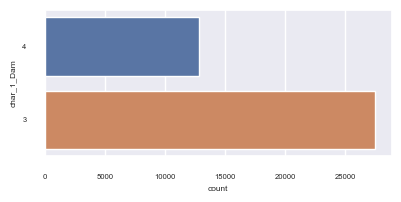


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_1_Dam                    
3           0.739805  0.677718
4           0.260195  0.322282


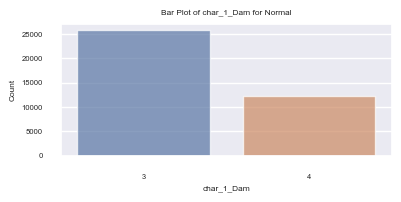

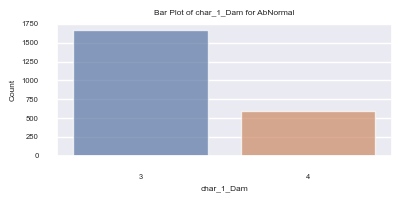

+++++++++ unique 확인 +++++++++
char_2_Dam
M    4638
G    4614
J    4153
A    3971
L    3810
H    3488
K    3303
B    3059
E    2735
F    2253
I    2225
C    2163
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


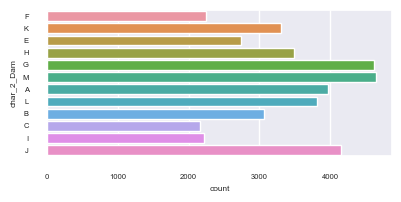


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_2_Dam                    
A           0.084663  0.099067
B           0.050532  0.077183
C           0.042110  0.054199
E           0.061613  0.068036
F           0.069149  0.054959
G           0.185727  0.109943
H           0.138741  0.083211
I           0.072252  0.054041
J           0.084220  0.103863
K           0.048759  0.083683
L           0.060284  0.096289
M           0.101950  0.115526


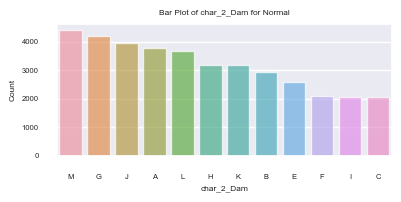

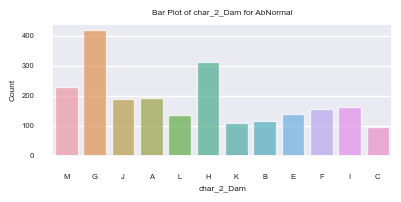

+++++++++ unique 확인 +++++++++
char_3_Dam
1    39402
P     1010
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


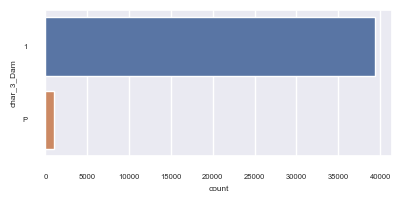


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_3_Dam                    
1           0.958333  0.975993
P           0.041667  0.024007


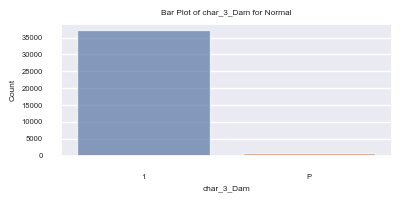

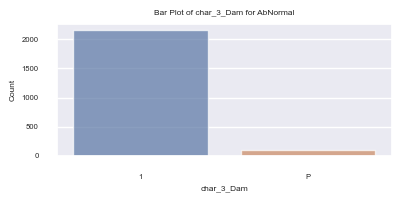

+++++++++ unique 확인 +++++++++
char_4_Dam
X    39789
M      623
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


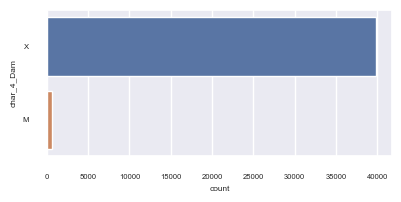


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_4_Dam                    
M           0.009752  0.015751
X           0.990248  0.984249


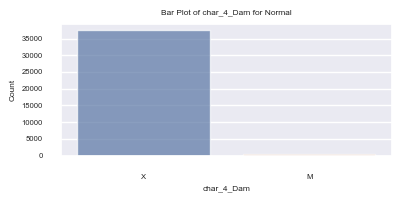

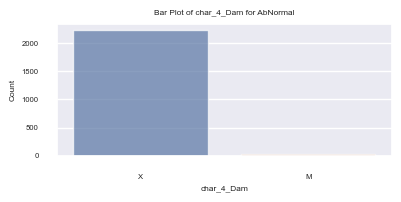

+++++++++ unique 확인 +++++++++
char_5_Dam
B    7209
A    6177
C    5863
9    3879
E    2922
8    2470
H    2148
D    2095
0    1567
F    1341
G    1283
7     867
1     831
X     387
4     321
J     297
2     295
3     192
6     162
5     106
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


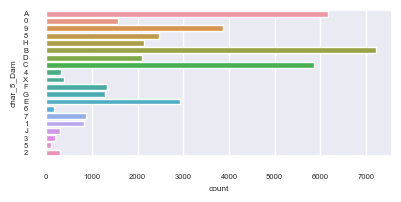


 +++++++++ unique 확인 / target 별 +++++++++
target      AbNormal    Normal
char_5_Dam                    
0           0.022606  0.039732
1           0.011968  0.021071
2           0.004876  0.007443
3           0.009309  0.004482
4           0.007092  0.007994
5           0.005319  0.002464
6           0.001773  0.004141
7           0.025709  0.021202
8           0.073138  0.060410
9           0.081560  0.096839
A           0.179521  0.151274
B           0.164894  0.179185
C           0.143617  0.145167
D           0.046099  0.052181
E           0.085550  0.071522
F           0.030585  0.033337
G           0.020833  0.032393
H           0.046986  0.053517
J           0.006649  0.007391
X           0.031915  0.008256


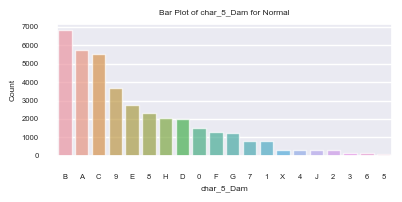

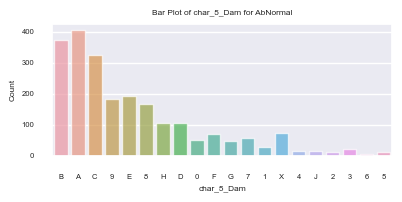

+++++++++ unique 확인 +++++++++
combined_678_Dam
644    425
258    361
425    315
129    300
501    299
      ... 
225      3
64       2
569      2
714      1
61       1
Name: count, Length: 439, dtype: int64

 +++++++++ 시각화 +++++++++


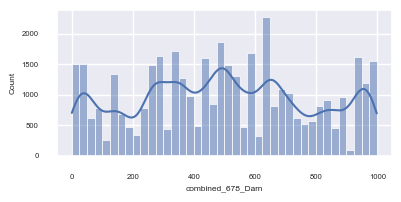


 +++++++++ unique 확인 / target 별 +++++++++
target            AbNormal    Normal
combined_678_Dam                    
0                 0.002660  0.001730
1                 0.000887  0.001441
2                 0.000887  0.000681
5                 0.004876  0.003879
7                 0.004433  0.002437
...                    ...       ...
994               0.002216  0.000943
995               0.005762  0.005871
996               0.003103  0.001494
997               0.001773  0.001258
998               0.005319  0.003459

[439 rows x 2 columns]


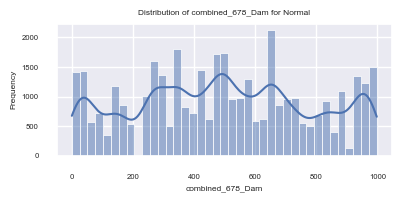

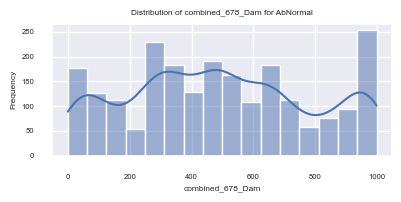

+++++++++ unique 확인 +++++++++
after_dash_Dam
1       33574
2        6073
0001      360
3         197
4         181
0002       25
0003        2
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


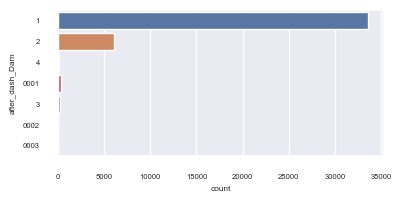


 +++++++++ unique 확인 / target 별 +++++++++
target          AbNormal    Normal
after_dash_Dam                    
0001            0.031028  0.007600
0002            0.000887  0.000603
0003            0.000000  0.000052
1               0.823138  0.831245
2               0.137855  0.151012
3               0.002660  0.005006
4               0.004433  0.004482


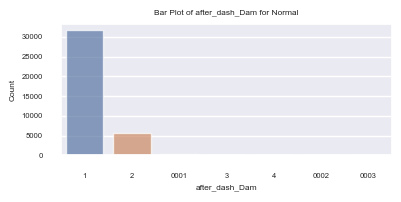

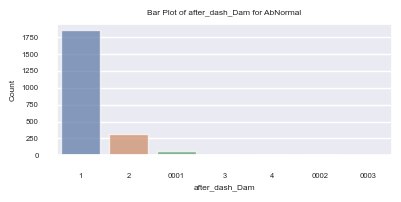

In [22]:
data_ana(train_data, 'char_1_Dam')
data_ana(train_data, 'char_2_Dam')
data_ana(train_data, 'char_3_Dam')
data_ana(train_data, 'char_4_Dam')
data_ana(train_data, 'char_5_Dam')
data_ana(train_data, 'combined_678_Dam')
data_ana(train_data, 'after_dash_Dam')

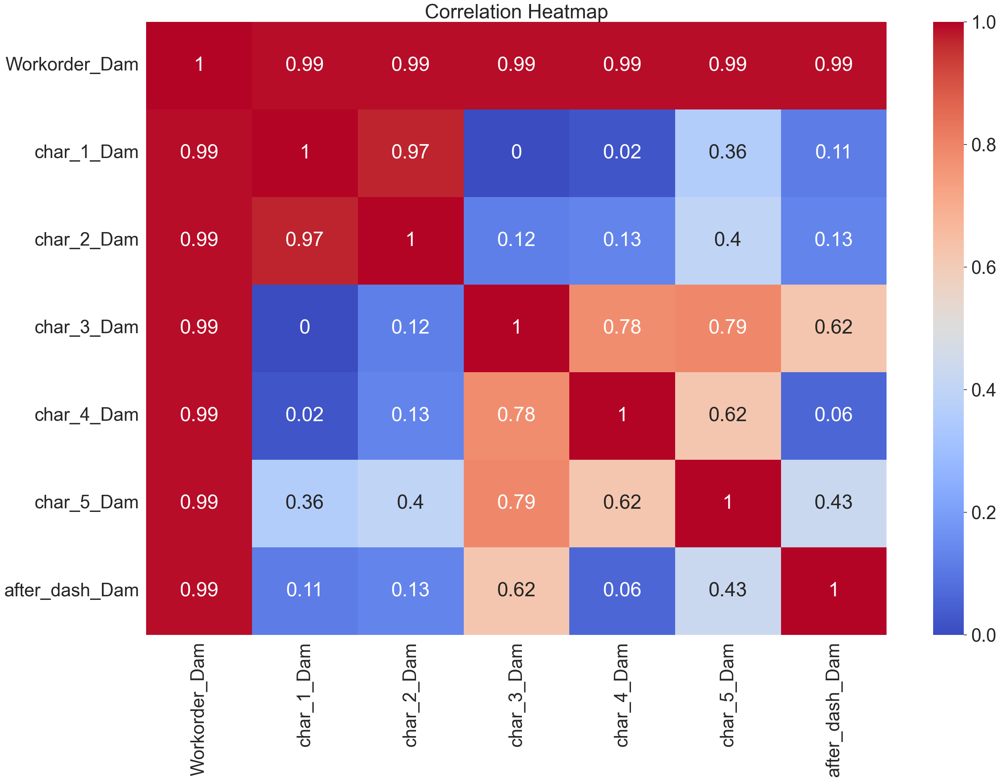

In [23]:
cv_matrix = calculate_cramers_v(train_data[['Workorder_Dam',
                                           'char_1_Dam',
                                           'char_2_Dam',
                                           'char_3_Dam',
                                           'char_4_Dam',
                                           'char_5_Dam',
                                           'combined_678_Dam',
                                           'after_dash_Dam']])
sns.set(font_scale=3)
plt.figure(figsize=(30, 20))
sns.heatmap(cv_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [24]:
# 결과 출력
train_data = train_data.drop(['Workorder_Dam', 'char_1_Dam'], axis=1)
test_data = test_data.drop(['Workorder_Dam', 'char_1_Dam'], axis=1)

# 2. DiCHARGED, dispense

In [25]:
def create_resin_features(data, stages):
    derived_features = pd.DataFrame()
    
    for stage in stages:
        # 총 배출량 계산 (Stage1, Stage2, Stage3의 Volume 합)
        derived_features[f'Total_Dispensed_Volume_{stage}'] = (data[f'Dispense Volume(Stage1) Collect Result_{stage}'] +
                                                   data[f'Dispense Volume(Stage2) Collect Result_{stage}'] +
                                                   data[f'Dispense Volume(Stage3) Collect Result_{stage}'])

        # 총 시간 계산 (Stage1, Stage2, Stage3의 Time 합)
        derived_features[f'Total_Dispensed_Time_{stage}'] = (data[f'DISCHARGED TIME OF RESIN(Stage1) Collect Result_{stage}'] +
                                                   data[f'DISCHARGED TIME OF RESIN(Stage2) Collect Result_{stage}'] +
                                                   data[f'DISCHARGED TIME OF RESIN(Stage3) Collect Result_{stage}'])
        
        # 각 스테이지에서 Volume/Time을 통해 레진 분출률 계산
        derived_features[f'Resin_Flow_Rate_Stage1_{stage}'] = data[f'Dispense Volume(Stage1) Collect Result_{stage}'] / data[f'DISCHARGED TIME OF RESIN(Stage1) Collect Result_{stage}']
        derived_features[f'Resin_Flow_Rate_Stage2_{stage}'] = data[f'Dispense Volume(Stage2) Collect Result_{stage}'] / data[f'DISCHARGED TIME OF RESIN(Stage2) Collect Result_{stage}']
        derived_features[f'Resin_Flow_Rate_Stage3_{stage}'] = data[f'Dispense Volume(Stage3) Collect Result_{stage}'] / data[f'DISCHARGED TIME OF RESIN(Stage3) Collect Result_{stage}']
        
        # 각 스테이지에서 Speed와 Time을 곱하여 Discharged 분출량 계산
        derived_features[f'Discharged_Amount_Stage1_{stage}'] = data[f'DISCHARGED SPEED OF RESIN Collect Result_{stage}'] * data[f'DISCHARGED TIME OF RESIN(Stage1) Collect Result_{stage}']
        derived_features[f'Discharged_Amount_Stage2_{stage}'] = data[f'DISCHARGED SPEED OF RESIN Collect Result_{stage}'] * data[f'DISCHARGED TIME OF RESIN(Stage2) Collect Result_{stage}']
        derived_features[f'Discharged_Amount_Stage3_{stage}'] = data[f'DISCHARGED SPEED OF RESIN Collect Result_{stage}'] * data[f'DISCHARGED TIME OF RESIN(Stage3) Collect Result_{stage}']
    
    return derived_features

# 함수를 적용하여 train_data와 test_data에 파생변수 생성
stages = ['Dam', 'Fill1']
train_features = create_resin_features(train_data, stages)
test_features = create_resin_features(test_data, stages)

# 결과 확인
print(train_features.head())
print(test_features.head())

   Total_Dispensed_Volume_Dam  Total_Dispensed_Time_Dam  \
0                        2.64                      38.0   
1                        3.32                      47.5   
2                        4.15                      37.9   
3                        3.56                      51.0   
4                        1.68                      24.2   

   Resin_Flow_Rate_Stage1_Dam  Resin_Flow_Rate_Stage2_Dam  \
0                    0.069799                    0.069048   
1                    0.069953                    0.069388   
2                    0.109524                    0.109412   
3                    0.069953                    0.069048   
4                    0.069072                    0.069388   

   Resin_Flow_Rate_Stage3_Dam  Discharged_Amount_Stage1_Dam  \
0                    0.069388                         238.4   
1                    0.069953                         213.0   
2                    0.109524                         235.2   
3                    0.069

In [26]:
train_data = pd.concat([train_data, train_features], axis=1)
test_data = pd.concat([test_data, test_features], axis=1)

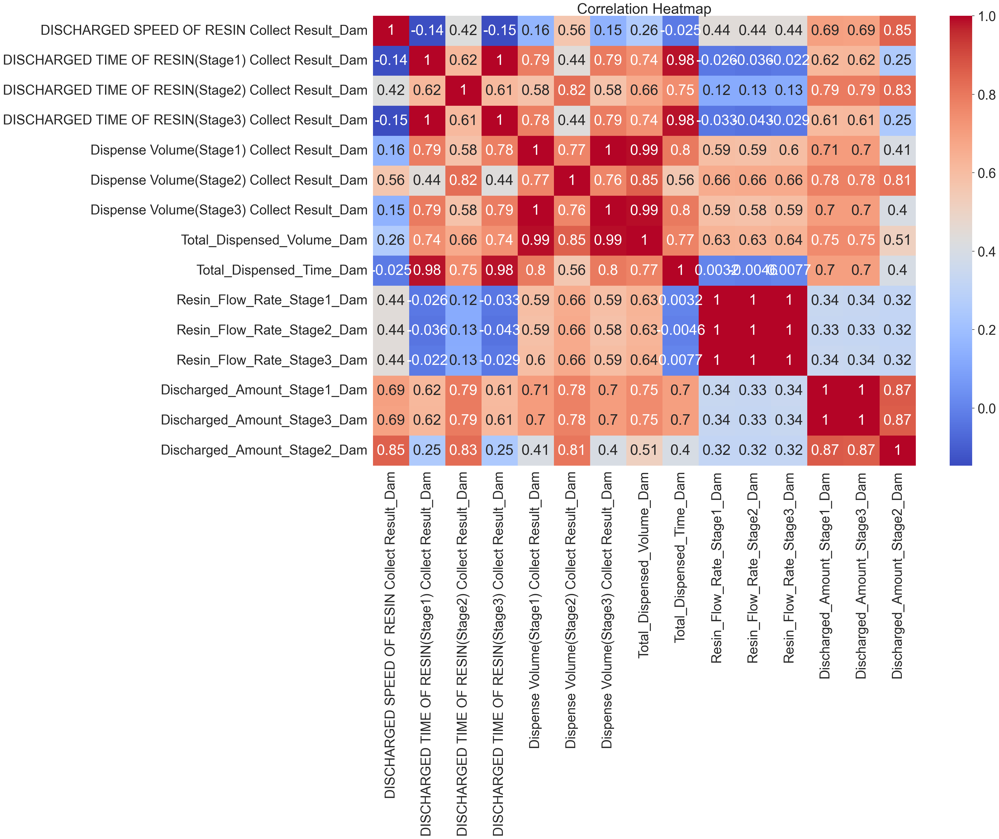

In [27]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['DISCHARGED SPEED OF RESIN Collect Result_Dam',
                                  'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
                                  'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
                                  'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
                                  'Dispense Volume(Stage1) Collect Result_Dam',
                                  'Dispense Volume(Stage2) Collect Result_Dam',
                                  'Dispense Volume(Stage3) Collect Result_Dam',
                                 'Total_Dispensed_Volume_Dam',
                                'Total_Dispensed_Time_Dam',
                                 'Resin_Flow_Rate_Stage1_Dam',
                                 'Resin_Flow_Rate_Stage2_Dam',
                                 'Resin_Flow_Rate_Stage3_Dam',
                                 'Discharged_Amount_Stage1_Dam',
                                 'Discharged_Amount_Stage3_Dam',
                                 'Discharged_Amount_Stage2_Dam']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [28]:
train_data, removed_features = remove_highly_correlated_features(train_data[['DISCHARGED SPEED OF RESIN Collect Result_Dam',
                                  'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
                                  'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
                                  'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
                                  'Dispense Volume(Stage1) Collect Result_Dam',
                                  'Dispense Volume(Stage2) Collect Result_Dam',
                                  'Dispense Volume(Stage3) Collect Result_Dam',
                                 'Total_Dispensed_Volume_Dam',
                                'Total_Dispensed_Time_Dam',
                                 'Resin_Flow_Rate_Stage1_Dam',
                                 'Resin_Flow_Rate_Stage2_Dam',
                                 'Resin_Flow_Rate_Stage3_Dam',
                                 'Discharged_Amount_Stage1_Dam',
                                 'Discharged_Amount_Stage3_Dam',
                                 'Discharged_Amount_Stage2_Dam']].corr(method='pearson'), train_data, threshold=0.9)

# 결과 출력
test_data = test_data.drop(columns=removed_features)
print("제거된 변수:", removed_features)

제거된 변수: ['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam', 'Total_Dispensed_Volume_Dam', 'Total_Dispensed_Time_Dam', 'Resin_Flow_Rate_Stage2_Dam', 'Resin_Flow_Rate_Stage3_Dam', 'Discharged_Amount_Stage3_Dam']


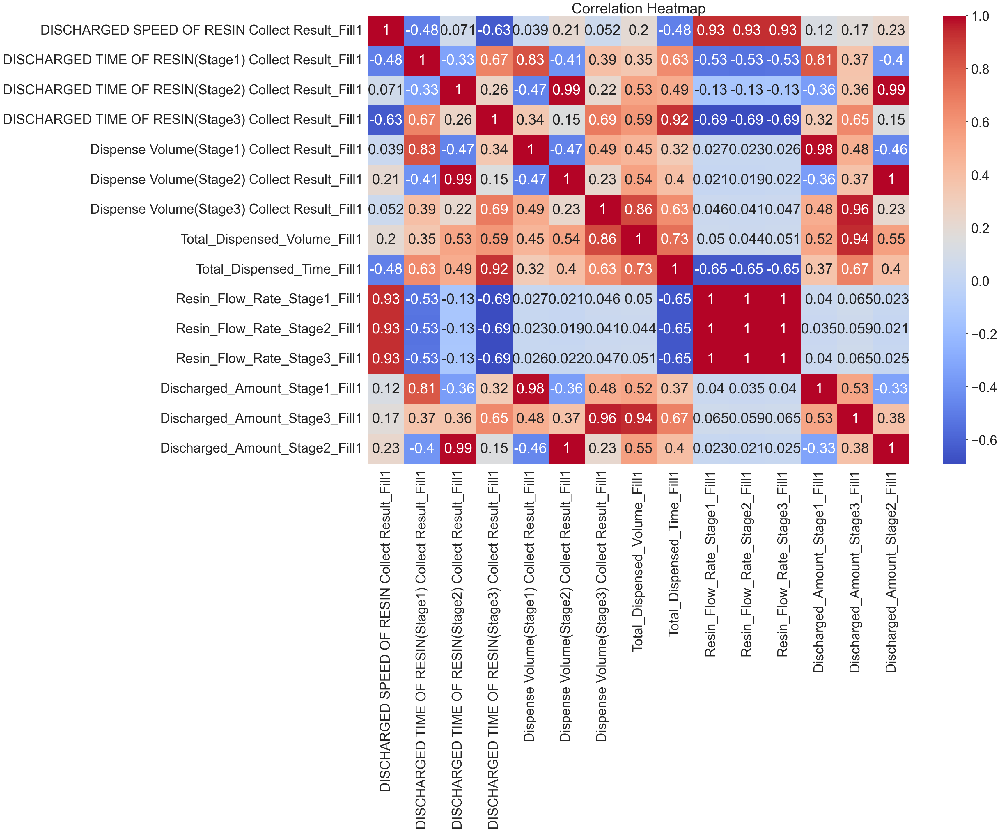

In [29]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['DISCHARGED SPEED OF RESIN Collect Result_Fill1',
                                  'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1',
                                  'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1',
                                  'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1',
                                  'Dispense Volume(Stage1) Collect Result_Fill1',
                                  'Dispense Volume(Stage2) Collect Result_Fill1',
                                  'Dispense Volume(Stage3) Collect Result_Fill1',
                                 'Total_Dispensed_Volume_Fill1',
                                  'Total_Dispensed_Time_Fill1',
                                 'Resin_Flow_Rate_Stage1_Fill1',
                                 'Resin_Flow_Rate_Stage2_Fill1',
                                 'Resin_Flow_Rate_Stage3_Fill1',
                                 'Discharged_Amount_Stage1_Fill1',
                                 'Discharged_Amount_Stage3_Fill1',
                                 'Discharged_Amount_Stage2_Fill1']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [30]:
train_data, removed_features = remove_highly_correlated_features(train_data[['DISCHARGED SPEED OF RESIN Collect Result_Fill1',
                                  'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1',
                                  'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1',
                                  'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1',
                                  'Dispense Volume(Stage1) Collect Result_Fill1',
                                  'Dispense Volume(Stage2) Collect Result_Fill1',
                                  'Dispense Volume(Stage3) Collect Result_Fill1',
                                 'Total_Dispensed_Volume_Fill1',
                                  'Total_Dispensed_Time_Fill1',
                                 'Resin_Flow_Rate_Stage1_Fill1',
                                 'Resin_Flow_Rate_Stage2_Fill1',
                                 'Resin_Flow_Rate_Stage3_Fill1',
                                 'Discharged_Amount_Stage1_Fill1',
                                 'Discharged_Amount_Stage3_Fill1',
                                 'Discharged_Amount_Stage2_Fill1']].corr(method='pearson'), train_data, threshold=0.93)

# 결과 출력
test_data = test_data.drop(columns=removed_features)
print("제거된 변수:", removed_features)

제거된 변수: ['Dispense Volume(Stage2) Collect Result_Fill1', 'Resin_Flow_Rate_Stage1_Fill1', 'Resin_Flow_Rate_Stage2_Fill1', 'Resin_Flow_Rate_Stage3_Fill1', 'Discharged_Amount_Stage1_Fill1', 'Discharged_Amount_Stage3_Fill1', 'Discharged_Amount_Stage2_Fill1']


# 3. Head

In [31]:
def create_coordinate_features(data, stages):
    # 파생변수를 담을 데이터프레임
    derived_features = pd.DataFrame()

    # 벡터 크기 계산 함수 (L2 노름)
    def calculate_vector_magnitude(x1, y1, z1, x2, y2, z2):
        return np.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)

    # 좌표 차이값 계산 함수
    def calculate_coordinate_difference(coord1, coord2):
        return coord2 - coord1

    # 주어진 단계에 대해 반복 수행
    for stage in stages:
        # 벡터 크기 계산
        derived_features[f'S1_S2_VECTOR_{stage}'] = calculate_vector_magnitude(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}']
        )

        derived_features[f'S2_S3_VECTOR_{stage}'] = calculate_vector_magnitude(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_{stage}']
        )

        # 좌표 차이값 계산
        derived_features[f'S1_S2_X_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}']
        )
        derived_features[f'S1_S2_Y_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}']
        )
        derived_features[f'S1_S2_Z_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}']
        )

        derived_features[f'S2_S3_X_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_{stage}']
        )
        derived_features[f'S2_S3_Y_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_{stage}']
        )
        derived_features[f'S2_S3_Z_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_{stage}']
        )

    return derived_features

# train_data와 test_data에 대해 함수 적용
stages = ['Dam', 'Fill1']
train_features = create_coordinate_features(train_data, stages)
test_features = create_coordinate_features(test_data, stages)

# 결과 확인
print(train_features.head())
print(test_features.head())


   S1_S2_VECTOR_Dam  S2_S3_VECTOR_Dam  S1_S2_X_DIFF_Dam  S1_S2_Y_DIFF_Dam  \
0         86.204698        302.901337             -86.2              -0.9   
1         86.500000        303.000000             -86.5               0.0   
2        323.071834        141.471198             303.0             112.1   
3        303.101996         86.506994             303.1              -1.1   
4         86.501445        303.000413             -86.5              -0.5   

   S1_S2_Z_DIFF_Dam  S2_S3_X_DIFF_Dam  S2_S3_Y_DIFF_Dam  S2_S3_Z_DIFF_Dam  \
0               0.0            -302.9               0.9               0.0   
1               0.0            -303.0               0.0               0.0   
2               0.0              86.3            -112.1               0.0   
3               0.0              86.5               1.1               0.0   
4               0.0            -303.0               0.5               0.0   

   S1_S2_VECTOR_Fill1  S2_S3_VECTOR_Fill1  S1_S2_X_DIFF_Fill1  \
0        

In [32]:
train_data = pd.concat([train_data, train_features], axis=1)
test_data = pd.concat([test_data, test_features], axis=1)

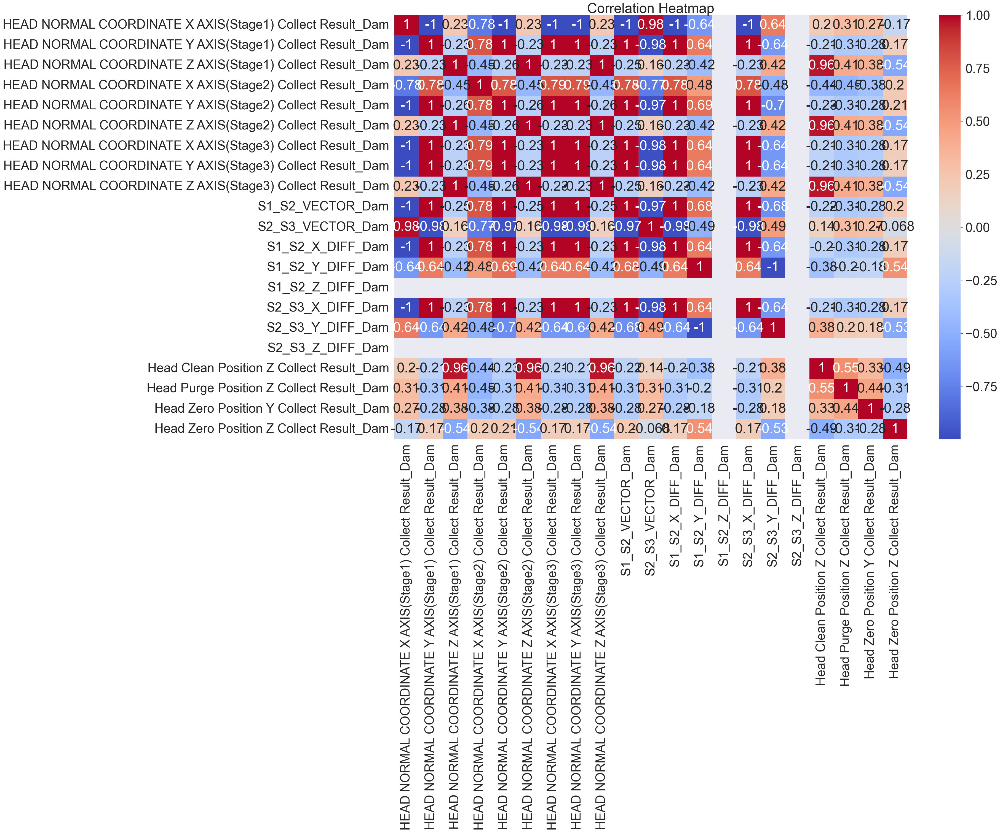

In [33]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
         'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
         'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam',
         'S1_S2_VECTOR_Dam',
         'S2_S3_VECTOR_Dam',
         'S1_S2_X_DIFF_Dam',
          'S1_S2_Y_DIFF_Dam',
          'S1_S2_Z_DIFF_Dam',
          'S2_S3_X_DIFF_Dam',
          'S2_S3_Y_DIFF_Dam',
          'S2_S3_Z_DIFF_Dam',                  
         'Head Clean Position Z Collect Result_Dam',
         'Head Purge Position Z Collect Result_Dam',
         'Head Zero Position Y Collect Result_Dam',
         'Head Zero Position Z Collect Result_Dam']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [34]:
train_data, removed_features = remove_highly_correlated_features(train_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
         'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
         'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
         'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam',
         'S1_S2_VECTOR_Dam',
         'S2_S3_VECTOR_Dam',
         'S1_S2_X_DIFF_Dam',
          'S1_S2_Y_DIFF_Dam',
          'S1_S2_Z_DIFF_Dam',
          'S2_S3_X_DIFF_Dam',
          'S2_S3_Y_DIFF_Dam',
          'S2_S3_Z_DIFF_Dam',                                                                    
         'Head Clean Position Z Collect Result_Dam',
         'Head Purge Position Z Collect Result_Dam',
         'Head Zero Position Y Collect Result_Dam',
         'Head Zero Position Z Collect Result_Dam']].corr(method='pearson'), train_data, threshold=0.9)

# 결과 출력
train_data = train_data.drop(['S1_S2_Z_DIFF_Dam', 'S2_S3_Z_DIFF_Dam'], axis=1)
test_data = test_data.drop(columns=removed_features)

print("제거된 변수:", removed_features)

제거된 변수: ['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam', 'S1_S2_VECTOR_Dam', 'S2_S3_VECTOR_Dam', 'S1_S2_X_DIFF_Dam', 'S2_S3_X_DIFF_Dam', 'S2_S3_Y_DIFF_Dam', 'Head Clean Position Z Collect Result_Dam']


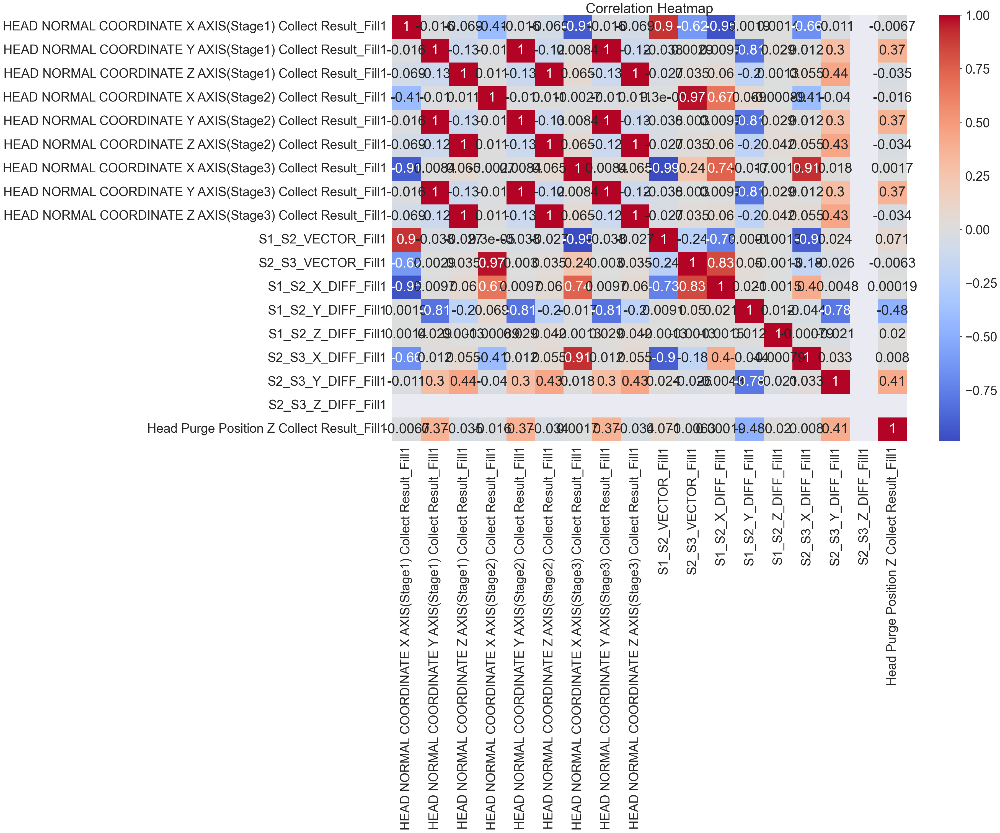

In [35]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1',
         'S1_S2_VECTOR_Fill1',
         'S2_S3_VECTOR_Fill1',
         'S1_S2_X_DIFF_Fill1',
          'S1_S2_Y_DIFF_Fill1',
          'S1_S2_Z_DIFF_Fill1',
          'S2_S3_X_DIFF_Fill1',
          'S2_S3_Y_DIFF_Fill1',
          'S2_S3_Z_DIFF_Fill1',  
         'Head Purge Position Z Collect Result_Fill1']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [36]:
train_data, removed_features = remove_highly_correlated_features(train_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1',
         'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1',
         'S1_S2_VECTOR_Fill1',
         'S2_S3_VECTOR_Fill1',
         'S1_S2_X_DIFF_Fill1',
          'S1_S2_Y_DIFF_Fill1',
          'S1_S2_Z_DIFF_Fill1',
          'S2_S3_X_DIFF_Fill1',
          'S2_S3_Y_DIFF_Fill1',
          'S2_S3_Z_DIFF_Fill1',
         'Head Purge Position Z Collect Result_Fill1']].corr(method='pearson'), train_data, threshold=0.9)

# 결과 출력
train_data = train_data.drop(['S2_S3_Z_DIFF_Fill1'], axis=1)
test_data = test_data.drop(columns=removed_features)
print("제거된 변수:", removed_features)

제거된 변수: ['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1', 'S1_S2_VECTOR_Fill1', 'S2_S3_VECTOR_Fill1', 'S1_S2_X_DIFF_Fill1', 'S2_S3_X_DIFF_Fill1']


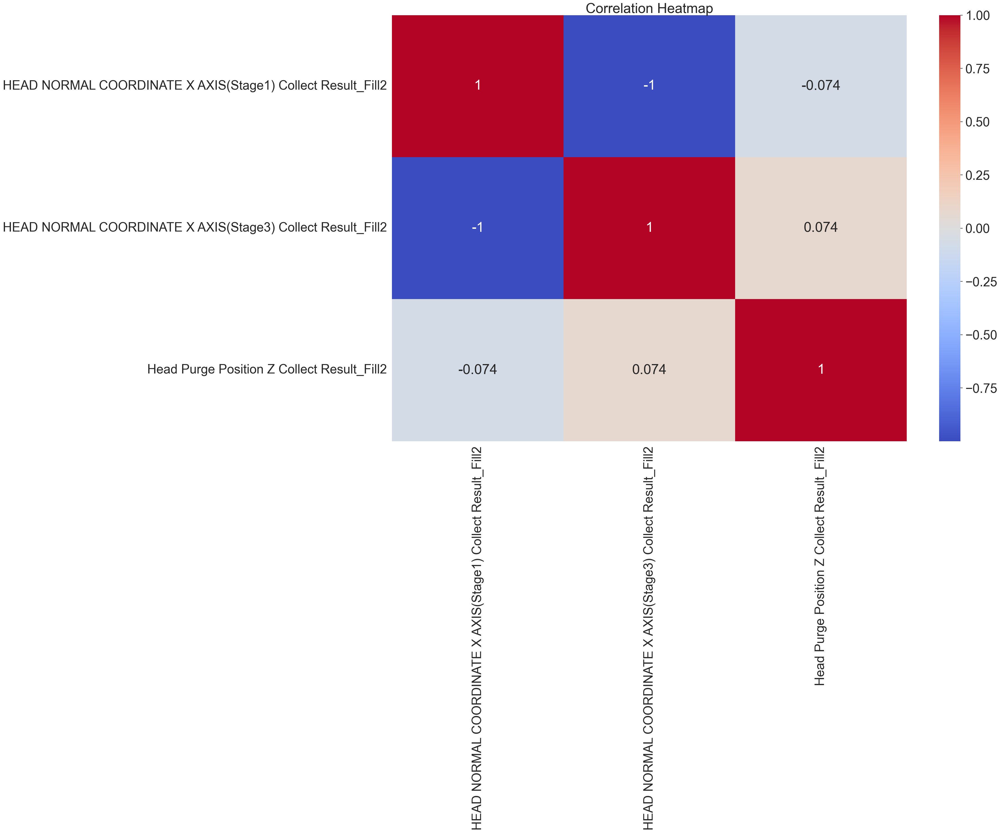

In [37]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2',
                                 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2',
                                 'Head Purge Position Z Collect Result_Fill2']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [38]:
train_data, removed_features = remove_highly_correlated_features(train_data[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2',
                                 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2',
                                'Head Purge Position Z Collect Result_Fill2']].corr(method='pearson'), train_data, threshold=0.9)

# 결과 출력
test_data = test_data.drop(columns=removed_features)
print("제거된 변수:", removed_features)

제거된 변수: ['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2']


# 4. circle, line

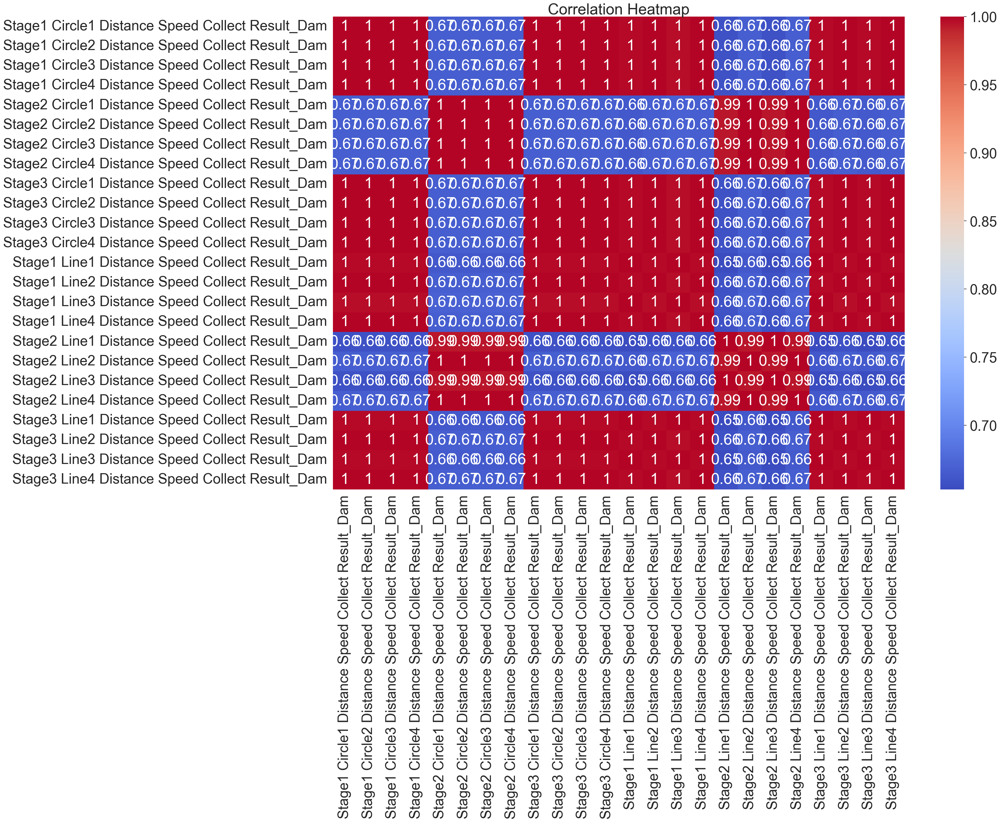

In [39]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['Stage1 Circle1 Distance Speed Collect Result_Dam',
                                 'Stage1 Circle2 Distance Speed Collect Result_Dam',
                                 'Stage1 Circle3 Distance Speed Collect Result_Dam',
                                 'Stage1 Circle4 Distance Speed Collect Result_Dam',
                                 'Stage2 Circle1 Distance Speed Collect Result_Dam',
                                 'Stage2 Circle2 Distance Speed Collect Result_Dam',
                                 'Stage2 Circle3 Distance Speed Collect Result_Dam',
                                  'Stage2 Circle4 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle1 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle2 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle3 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle4 Distance Speed Collect Result_Dam',
                                  'Stage1 Line1 Distance Speed Collect Result_Dam',
                                 'Stage1 Line2 Distance Speed Collect Result_Dam',
                                 'Stage1 Line3 Distance Speed Collect Result_Dam',
                                 'Stage1 Line4 Distance Speed Collect Result_Dam',
                                 'Stage2 Line1 Distance Speed Collect Result_Dam',
                                 'Stage2 Line2 Distance Speed Collect Result_Dam',
                                 'Stage2 Line3 Distance Speed Collect Result_Dam',
                                 'Stage2 Line4 Distance Speed Collect Result_Dam',
                                 'Stage3 Line1 Distance Speed Collect Result_Dam',
                                 'Stage3 Line2 Distance Speed Collect Result_Dam',
                                 'Stage3 Line3 Distance Speed Collect Result_Dam',
                                 'Stage3 Line4 Distance Speed Collect Result_Dam']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [40]:
train_data, removed_features = remove_highly_correlated_features(train_data[[
    'Stage1 Circle1 Distance Speed Collect Result_Dam',
                                 'Stage1 Circle2 Distance Speed Collect Result_Dam',
                                 'Stage1 Circle3 Distance Speed Collect Result_Dam',
                                 'Stage1 Circle4 Distance Speed Collect Result_Dam',
                                 'Stage2 Circle1 Distance Speed Collect Result_Dam',
                                 'Stage2 Circle2 Distance Speed Collect Result_Dam',
                                 'Stage2 Circle3 Distance Speed Collect Result_Dam',
                                  'Stage2 Circle4 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle1 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle2 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle3 Distance Speed Collect Result_Dam',
                                  'Stage3 Circle4 Distance Speed Collect Result_Dam',
                                  'Stage1 Line1 Distance Speed Collect Result_Dam',
                                 'Stage1 Line2 Distance Speed Collect Result_Dam',
                                 'Stage1 Line3 Distance Speed Collect Result_Dam',
                                 'Stage1 Line4 Distance Speed Collect Result_Dam',
                                 'Stage2 Line1 Distance Speed Collect Result_Dam',
                                 'Stage2 Line2 Distance Speed Collect Result_Dam',
                                 'Stage2 Line3 Distance Speed Collect Result_Dam',
                                 'Stage2 Line4 Distance Speed Collect Result_Dam',
                                 'Stage3 Line1 Distance Speed Collect Result_Dam',
                                 'Stage3 Line2 Distance Speed Collect Result_Dam',
                                 'Stage3 Line3 Distance Speed Collect Result_Dam',
                                 'Stage3 Line4 Distance Speed Collect Result_Dam']].corr(method='pearson'), train_data, threshold=0.9)

# 결과 출력
test_data = test_data.drop(columns=removed_features)
print("제거된 변수:", removed_features)

제거된 변수: ['Stage1 Circle2 Distance Speed Collect Result_Dam', 'Stage1 Circle3 Distance Speed Collect Result_Dam', 'Stage1 Circle4 Distance Speed Collect Result_Dam', 'Stage2 Circle2 Distance Speed Collect Result_Dam', 'Stage2 Circle3 Distance Speed Collect Result_Dam', 'Stage2 Circle4 Distance Speed Collect Result_Dam', 'Stage3 Circle1 Distance Speed Collect Result_Dam', 'Stage3 Circle2 Distance Speed Collect Result_Dam', 'Stage3 Circle3 Distance Speed Collect Result_Dam', 'Stage3 Circle4 Distance Speed Collect Result_Dam', 'Stage1 Line1 Distance Speed Collect Result_Dam', 'Stage1 Line2 Distance Speed Collect Result_Dam', 'Stage1 Line3 Distance Speed Collect Result_Dam', 'Stage1 Line4 Distance Speed Collect Result_Dam', 'Stage2 Line1 Distance Speed Collect Result_Dam', 'Stage2 Line2 Distance Speed Collect Result_Dam', 'Stage2 Line3 Distance Speed Collect Result_Dam', 'Stage2 Line4 Distance Speed Collect Result_Dam', 'Stage3 Line1 Distance Speed Collect Result_Dam', 'Stage3 Line2 Distanc

# 5. TICKNESS

In [41]:
train_data['Sum_Thickness'] = train_data['THICKNESS 1 Collect Result_Dam'] + train_data['THICKNESS 2 Collect Result_Dam'] + train_data['THICKNESS 3 Collect Result_Dam']
test_data['Sum_Thickness'] = test_data['THICKNESS 1 Collect Result_Dam'] + test_data['THICKNESS 2 Collect Result_Dam'] + test_data['THICKNESS 3 Collect Result_Dam']

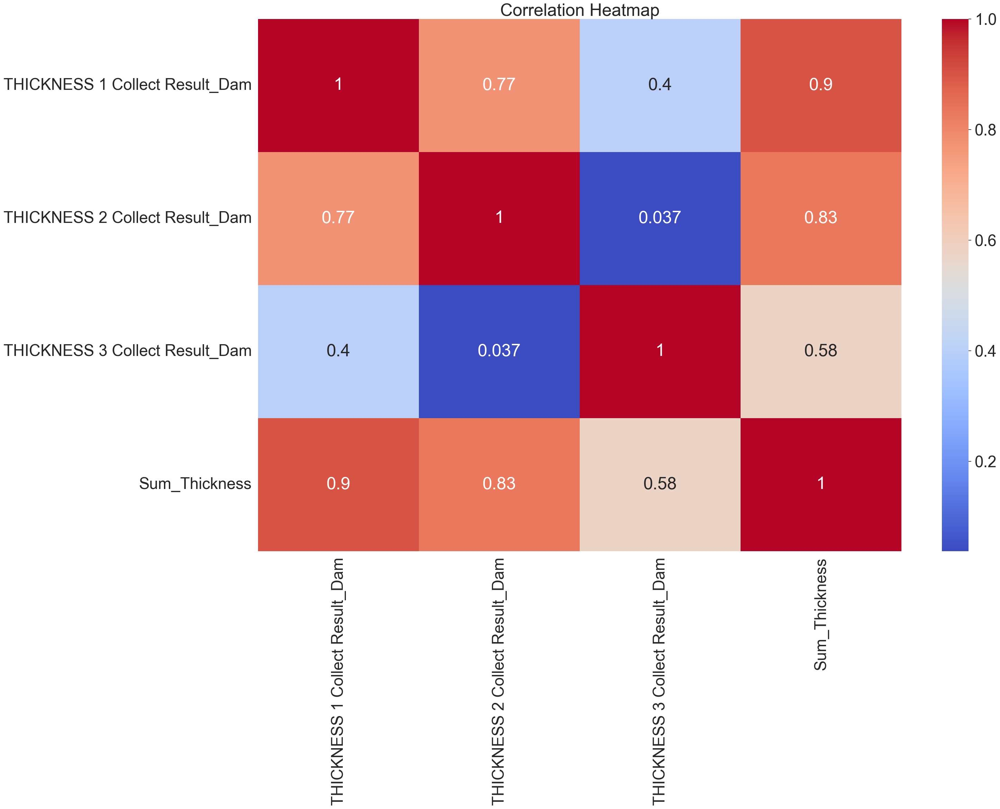

In [42]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['THICKNESS 1 Collect Result_Dam',
                                 'THICKNESS 2 Collect Result_Dam',
                                 'THICKNESS 3 Collect Result_Dam',
                                 'Sum_Thickness']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


# 6. Pressure

In [43]:
for df in [train_data, test_data]:
    df['1st Pressure*Time'] = np.round(df['1st Pressure Collect Result_AutoClave']*df['1st Pressure 1st Pressure Unit Time_AutoClave'],2)
    df['2nd Pressure*Time'] = np.round(df['2nd Pressure Collect Result_AutoClave']*df['2nd Pressure Unit Time_AutoClave'],2)
    df['3rd Pressure*Time'] = np.round(df['3rd Pressure Collect Result_AutoClave']*df['3rd Pressure Unit Time_AutoClave'],2)

    df['Mean Pressure'] = df[['1st Pressure Collect Result_AutoClave', '2nd Pressure Collect Result_AutoClave', '3rd Pressure Collect Result_AutoClave']].mean(axis=1)

In [44]:
## 중앙값과 거리
features = ['1st Pressure Collect Result_AutoClave',
            '2nd Pressure Collect Result_AutoClave',
            '3rd Pressure Collect Result_AutoClave',
            '1st Pressure 1st Pressure Unit Time_AutoClave',
            '2nd Pressure Unit Time_AutoClave',
            '3rd Pressure Unit Time_AutoClave']
for df in [train_data,test_data]:
    for feature in features:
        # 새로운 피쳐 생성 (중앙값과의 거리)
        feature_name = f'Medain Distance {feature}'
        print(feature_name)
        df[feature_name] = abs(df[feature] - df[feature].median())



Medain Distance 1st Pressure Collect Result_AutoClave
Medain Distance 2nd Pressure Collect Result_AutoClave
Medain Distance 3rd Pressure Collect Result_AutoClave
Medain Distance 1st Pressure 1st Pressure Unit Time_AutoClave
Medain Distance 2nd Pressure Unit Time_AutoClave
Medain Distance 3rd Pressure Unit Time_AutoClave
Medain Distance 1st Pressure Collect Result_AutoClave
Medain Distance 2nd Pressure Collect Result_AutoClave
Medain Distance 3rd Pressure Collect Result_AutoClave
Medain Distance 1st Pressure 1st Pressure Unit Time_AutoClave
Medain Distance 2nd Pressure Unit Time_AutoClave
Medain Distance 3rd Pressure Unit Time_AutoClave


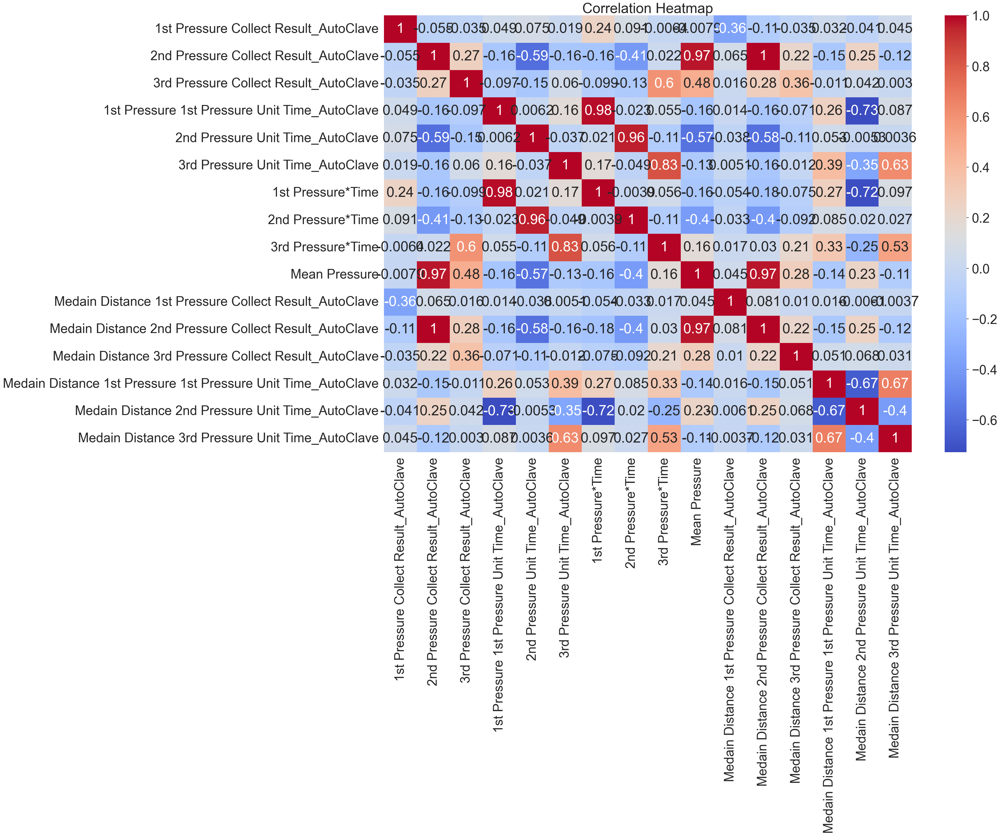

In [45]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)
heatmap = sns.heatmap(train_data[['1st Pressure Collect Result_AutoClave',
                                 '2nd Pressure Collect Result_AutoClave',
                                 '3rd Pressure Collect Result_AutoClave',
                                 '1st Pressure 1st Pressure Unit Time_AutoClave',
                                 '2nd Pressure Unit Time_AutoClave',
                                 '3rd Pressure Unit Time_AutoClave',
                                 '1st Pressure*Time',
                                 '2nd Pressure*Time',
                                 '3rd Pressure*Time',
                                 'Mean Pressure',
                                 'Medain Distance 1st Pressure Collect Result_AutoClave',
                                  'Medain Distance 2nd Pressure Collect Result_AutoClave',
                                  'Medain Distance 3rd Pressure Collect Result_AutoClave',
                                  'Medain Distance 1st Pressure 1st Pressure Unit Time_AutoClave',
                                  'Medain Distance 2nd Pressure Unit Time_AutoClave',
                                  'Medain Distance 3rd Pressure Unit Time_AutoClave']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [46]:
train_data, removed_features = remove_highly_correlated_features(train_data[[
    '1st Pressure Collect Result_AutoClave',
                                 '2nd Pressure Collect Result_AutoClave',
                                 '3rd Pressure Collect Result_AutoClave',
                                 '1st Pressure 1st Pressure Unit Time_AutoClave',
                                 '2nd Pressure Unit Time_AutoClave',
                                 '3rd Pressure Unit Time_AutoClave',
                                 '1st Pressure*Time',
                                 '2nd Pressure*Time',
                                 '3rd Pressure*Time',
                                 'Mean Pressure',
                                 'Medain Distance 1st Pressure Collect Result_AutoClave',
                                  'Medain Distance 2nd Pressure Collect Result_AutoClave',
                                  'Medain Distance 3rd Pressure Collect Result_AutoClave',
                                  'Medain Distance 1st Pressure 1st Pressure Unit Time_AutoClave',
                                  'Medain Distance 2nd Pressure Unit Time_AutoClave',
                                  'Medain Distance 3rd Pressure Unit Time_AutoClave']].corr(method='pearson'), train_data, threshold=0.9)

# 결과 출력
test_data = test_data.drop(columns=removed_features)
print("제거된 변수:", removed_features)

제거된 변수: ['1st Pressure*Time', '2nd Pressure*Time', 'Mean Pressure', 'Medain Distance 2nd Pressure Collect Result_AutoClave']


# 7. Chamber Temp

In [47]:
## 중앙값과 거리
features = ['Chamber Temp. Collect Result_AutoClave',
            'Chamber Temp. Unit Time_AutoClave']
for df in [train_data,test_data]:
    for feature in features:
        # 새로운 피쳐 생성 (중앙값과의 거리)
        feature_name = f'Medain Distance {feature}'
        df[feature_name] = abs(df[feature] - df[feature].median())

## Time * Temp
train_data['Chamber Temp*Time_AutoClave'] = train_data['Chamber Temp. Collect Result_AutoClave']*train_data['Chamber Temp. Unit Time_AutoClave']
test_data['Chamber Temp*Time_AutoClave'] = test_data['Chamber Temp. Collect Result_AutoClave']*test_data['Chamber Temp. Unit Time_AutoClave']

## encoding for cor
train_data['Chamber Judge encoded_AutoClave'] = train_data['Chamber Temp. Judge Value_AutoClave'].map({'NG': 1, 'OK': 0})
train_data = train_data.drop('Chamber Temp. Judge Value_AutoClave', axis=1)
test_data['Chamber Judge encoded_AutoClave'] = test_data['Chamber Temp. Judge Value_AutoClave'].map({'NG': 1, 'OK': 0})
test_data = test_data.drop('Chamber Temp. Judge Value_AutoClave', axis=1)

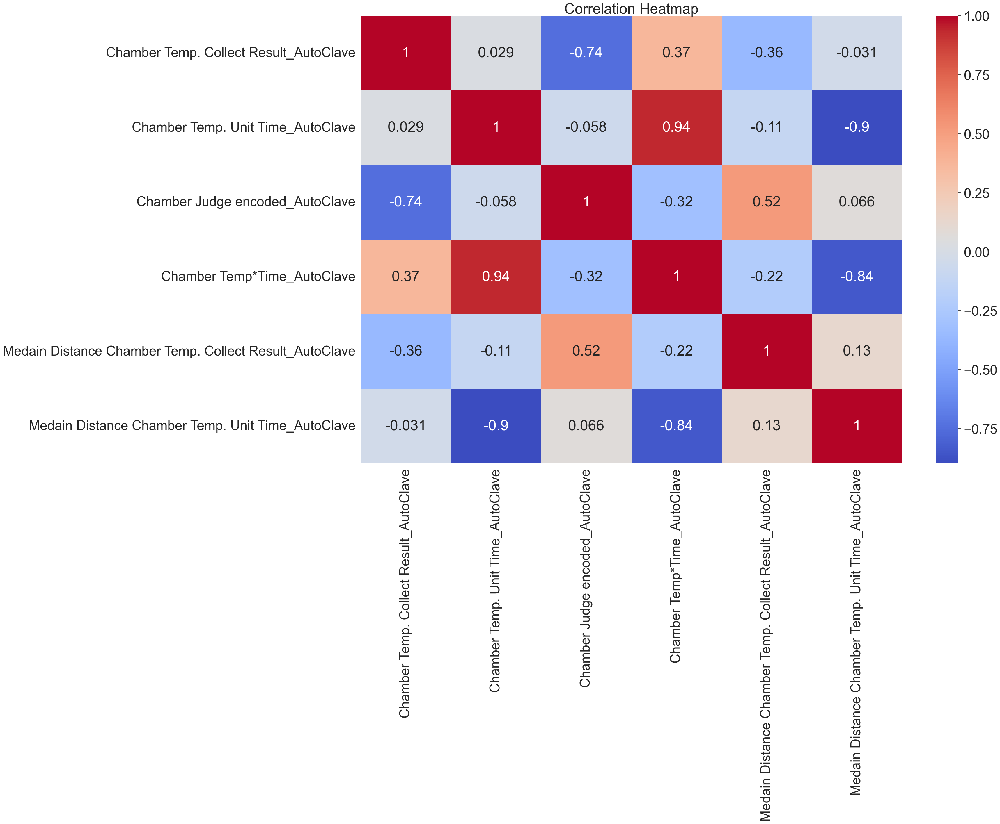

In [48]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)

heatmap = sns.heatmap(train_data[['Chamber Temp. Collect Result_AutoClave',
                                 'Chamber Temp. Unit Time_AutoClave',
                                 'Chamber Judge encoded_AutoClave',
                                 'Chamber Temp*Time_AutoClave',
                                 'Medain Distance Chamber Temp. Collect Result_AutoClave',
                                 'Medain Distance Chamber Temp. Unit Time_AutoClave']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


# 8. CURE

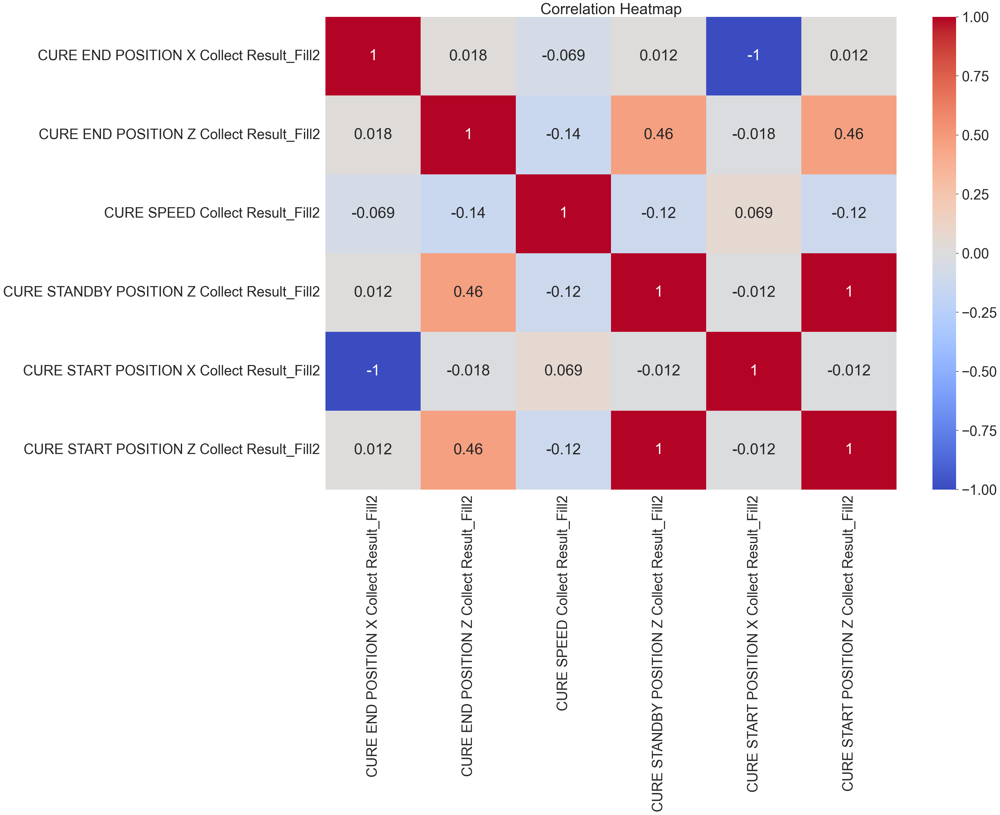

In [49]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)

heatmap = sns.heatmap(train_data[['CURE END POSITION X Collect Result_Fill2',
                                 'CURE END POSITION Z Collect Result_Fill2',
                                 'CURE SPEED Collect Result_Fill2',
                                 'CURE STANDBY POSITION Z Collect Result_Fill2',
                                 'CURE START POSITION X Collect Result_Fill2',
                                 'CURE START POSITION Z Collect Result_Fill2']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [50]:
train_data, removed_features = remove_highly_correlated_features(train_data[[
    'CURE END POSITION X Collect Result_Fill2',
                                 'CURE END POSITION Z Collect Result_Fill2',
                                 'CURE SPEED Collect Result_Fill2',
                                 'CURE STANDBY POSITION Z Collect Result_Fill2',
                                 'CURE START POSITION X Collect Result_Fill2',
                                 'CURE START POSITION Z Collect Result_Fill2']].corr(method='pearson'), train_data, threshold=0.9)

# 결과 출력
test_data = test_data.drop(columns=removed_features)
print("제거된 변수:", removed_features)

제거된 변수: ['CURE START POSITION X Collect Result_Fill2', 'CURE START POSITION Z Collect Result_Fill2']


# 9. 나머지

In [51]:
train_data['whole_time'] = train_data['Machine Tact time Collect Result_Dam'] + train_data['Machine Tact time Collect Result_Fill1'] + train_data['Machine Tact time Collect Result_Fill2']
test_data['whole_time'] = test_data['Machine Tact time Collect Result_Dam'] + test_data['Machine Tact time Collect Result_Fill1'] + test_data['Machine Tact time Collect Result_Fill2']


+++++++++ unique 확인 +++++++++
Equipment_Dam
0    24968
1    15444
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


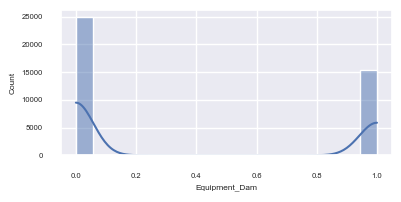


 +++++++++ unique 확인 / target 별 +++++++++
target         AbNormal    Normal
Equipment_Dam                    
0              0.630762  0.617072
1              0.369238  0.382928


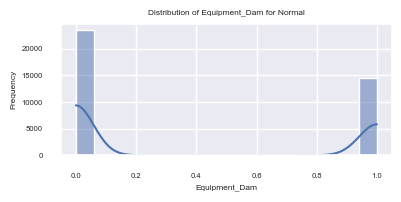

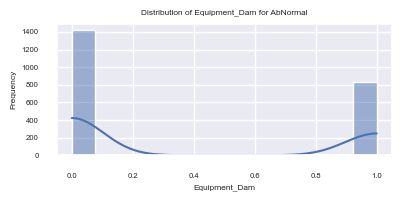

+++++++++ unique 확인 +++++++++
Model.Suffix_Dam
AJX75334501    33741
AJX75334502     3382
AJX75334505     2630
AJX75334507      308
AJX75334503      162
AJX75334506      129
AJX75334508       60
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


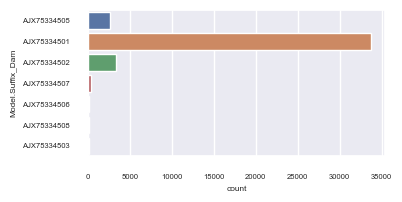


 +++++++++ unique 확인 / target 별 +++++++++
target            AbNormal    Normal
Model.Suffix_Dam                    
AJX75334501       0.815160  0.836094
AJX75334502       0.098404  0.082818
AJX75334503       0.019504  0.003093
AJX75334505       0.055408  0.065652
AJX75334506       0.003546  0.003171
AJX75334507       0.007092  0.007653
AJX75334508       0.000887  0.001520


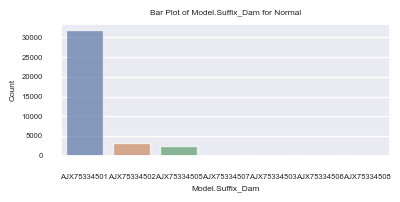

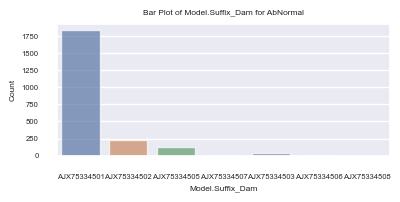

+++++++++ unique 확인 +++++++++
Machine Tact time Collect Result_Dam
92.2     1571
88.3     1290
88.4     1238
93.3     1043
93.2     1033
         ... 
46.1        1
46.0        1
84.1        1
92.5        1
110.5       1
Name: count, Length: 452, dtype: int64

 +++++++++ 시각화 +++++++++


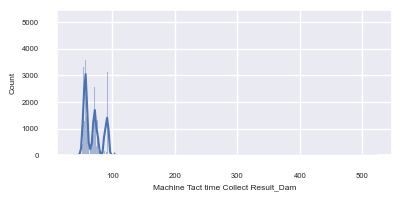


 +++++++++ unique 확인 / target 별 +++++++++
target                                AbNormal    Normal
Machine Tact time Collect Result_Dam                    
35.5                                       0.0  0.000026
35.6                                       0.0  0.000026
40.6                                       0.0  0.000026
44.4                                       0.0  0.000079
44.5                                       0.0  0.000052
...                                        ...       ...
244.7                                      0.0  0.000026
276.6                                      0.0  0.000026
283.7                                      0.0  0.000026
362.3                                      0.0  0.000026
523.0                                      0.0  0.000026

[452 rows x 2 columns]


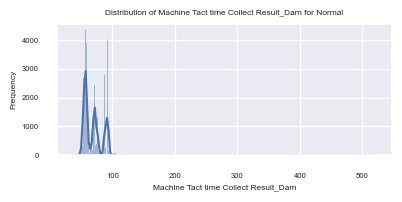

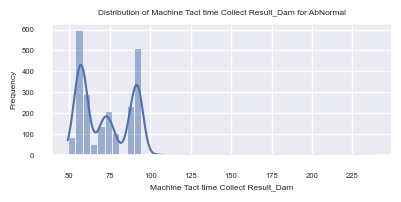

+++++++++ unique 확인 +++++++++
PalletID Collect Result_Dam
4.0     3173
3.0     3164
1.0     3145
2.0     3125
6.0     3114
5.0     3086
8.0     3082
7.0     3079
10.0    2015
12.0    2004
14.0    1980
15.0    1946
9.0     1915
11.0    1907
13.0    1903
16.0    1774
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


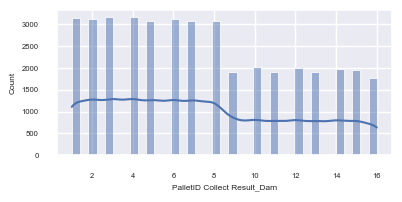


 +++++++++ unique 확인 / target 별 +++++++++
target                       AbNormal    Normal
PalletID Collect Result_Dam                    
1.0                          0.071365  0.078205
2.0                          0.092199  0.076449
3.0                          0.087766  0.077734
4.0                          0.075355  0.078703
5.0                          0.074025  0.076502
6.0                          0.080230  0.076869
7.0                          0.071809  0.076449
8.0                          0.078014  0.076161
9.0                          0.038564  0.047909
10.0                         0.045656  0.050110
11.0                         0.048316  0.047122
12.0                         0.037234  0.050320
13.0                         0.057181  0.046493
14.0                         0.042553  0.049376
15.0                         0.050975  0.047987
16.0                         0.048759  0.043610


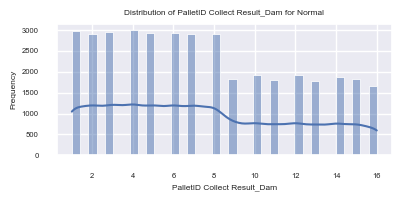

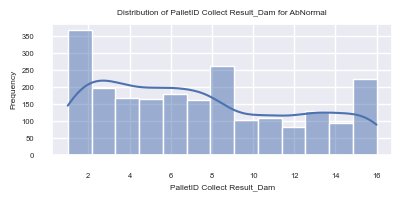

+++++++++ unique 확인 +++++++++
Production Qty Collect Result_Dam
8      147
14     146
28     145
48     144
30     144
      ... 
589      1
604      1
598      1
608      1
576      1
Name: count, Length: 607, dtype: int64

 +++++++++ 시각화 +++++++++


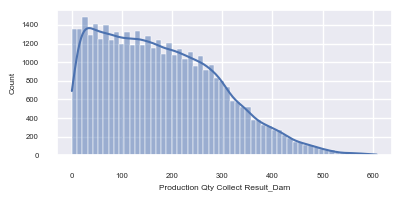


 +++++++++ unique 확인 / target 별 +++++++++
target                             AbNormal    Normal
Production Qty Collect Result_Dam                    
0                                  0.005762  0.002070
1                                  0.006206  0.002411
2                                  0.003103  0.002883
3                                  0.003989  0.002857
4                                  0.001773  0.002909
...                                     ...       ...
604                                0.000000  0.000026
605                                0.000000  0.000026
606                                0.000000  0.000026
607                                0.000000  0.000026
608                                0.000000  0.000026

[607 rows x 2 columns]


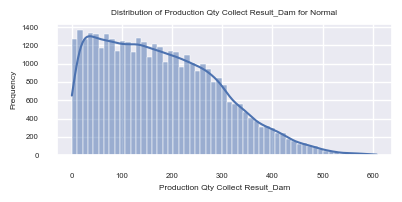

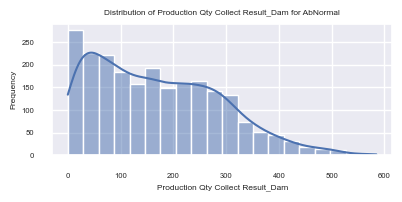

+++++++++ unique 확인 +++++++++
Receip No Collect Result_Dam
1     39186
6       980
9        96
17       86
3        64
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


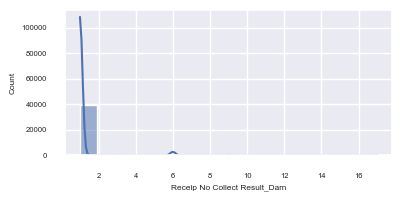


 +++++++++ unique 확인 / target 별 +++++++++
target                        AbNormal    Normal
Receip No Collect Result_Dam                    
1                             0.941933  0.971302
3                             0.019060  0.000550
6                             0.036348  0.023535
9                             0.000443  0.002490
17                            0.002216  0.002123


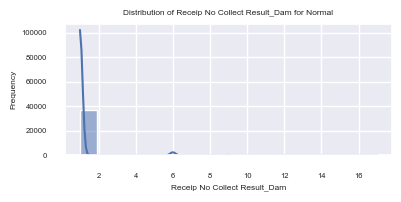

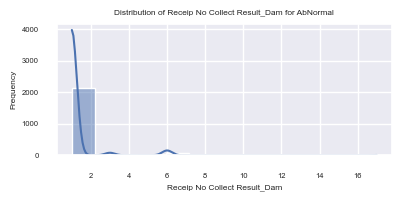

+++++++++ unique 확인 +++++++++
GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave
0.0    29136
1.0    11276
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


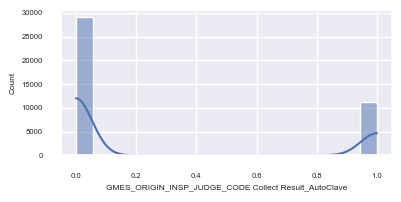


 +++++++++ unique 확인 / target 별 +++++++++
target                                              AbNormal   Normal
GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_Auto...                   
0.0                                                 0.787677  0.71703
1.0                                                 0.212323  0.28297


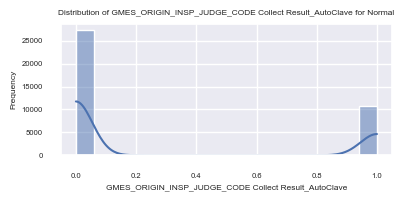

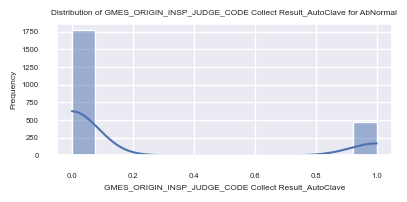

+++++++++ unique 확인 +++++++++
Chamber Judge encoded_AutoClave
0    29038
1    11374
Name: count, dtype: int64

 +++++++++ 시각화 +++++++++


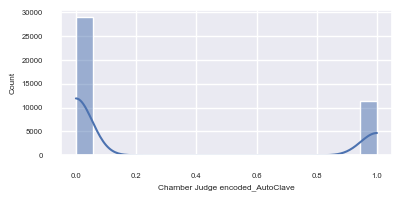


 +++++++++ unique 확인 / target 별 +++++++++
target                           AbNormal    Normal
Chamber Judge encoded_AutoClave                    
0                                0.720301  0.718445
1                                0.279699  0.281555


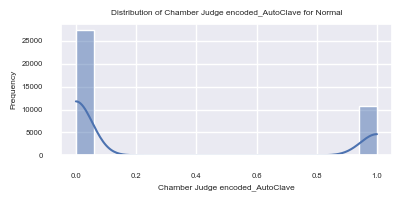

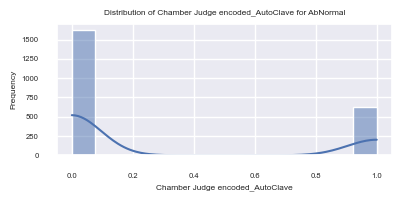

+++++++++ unique 확인 +++++++++
Machine Tact time Collect Result_Fill1
91.4     1966
57.4     1650
57.5     1259
91.3     1129
57.8     1093
         ... 
203.8       1
85.2        1
81.3        1
45.3        1
97.7        1
Name: count, Length: 354, dtype: int64

 +++++++++ 시각화 +++++++++


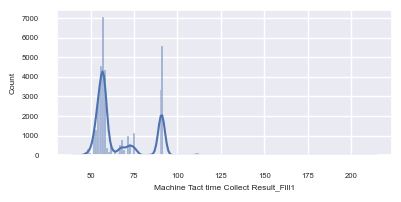


 +++++++++ unique 확인 / target 별 +++++++++
target                                  AbNormal    Normal
Machine Tact time Collect Result_Fill1                    
39.1                                    0.000000  0.000026
39.5                                    0.000000  0.000026
39.7                                    0.000000  0.000026
40.3                                    0.000443  0.000000
40.4                                    0.000000  0.000026
...                                          ...       ...
172.3                                   0.000443  0.000000
175.9                                   0.000000  0.000026
187.1                                   0.000000  0.000026
203.8                                   0.000000  0.000026
214.9                                   0.000000  0.000026

[354 rows x 2 columns]


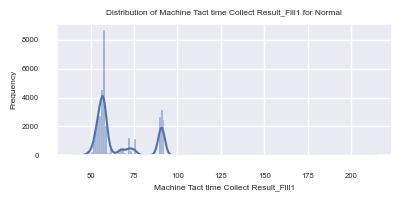

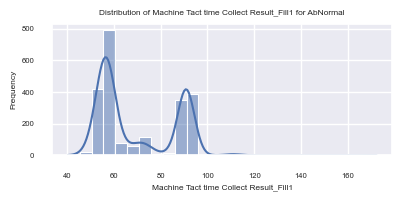

+++++++++ unique 확인 +++++++++
Machine Tact time Collect Result_Fill2
19.8     3769
19.9     3633
19.7     3539
19.6     3532
19.5     3130
         ... 
26.4        1
17.4        1
46.1        1
24.7        1
284.1       1
Name: count, Length: 80, dtype: int64

 +++++++++ 시각화 +++++++++


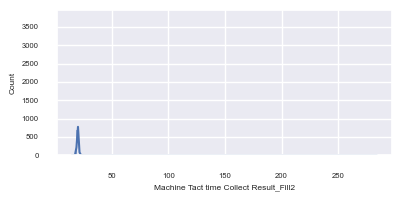


 +++++++++ unique 확인 / target 별 +++++++++
target                                  AbNormal    Normal
Machine Tact time Collect Result_Fill2                    
14.7                                         0.0  0.000026
17.3                                         0.0  0.000026
17.4                                         0.0  0.000026
17.5                                         0.0  0.000105
17.6                                         0.0  0.000157
...                                          ...       ...
26.4                                         0.0  0.000026
46.1                                         0.0  0.000026
47.1                                         0.0  0.000026
52.9                                         0.0  0.000026
284.1                                        0.0  0.000026

[80 rows x 2 columns]


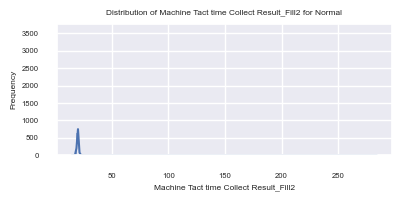

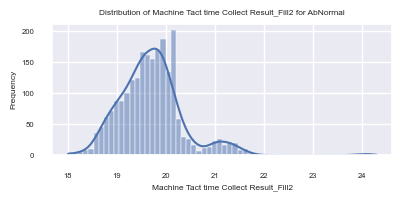

In [52]:
for i in ['Equipment_Dam',
         'Model.Suffix_Dam',
         'Machine Tact time Collect Result_Dam',
         'PalletID Collect Result_Dam',
         'Production Qty Collect Result_Dam',
         'Receip No Collect Result_Dam',
         'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave',
          'Chamber Judge encoded_AutoClave',
         'Machine Tact time Collect Result_Fill1',
         'Machine Tact time Collect Result_Fill2']:
    data_ana(train_data, i)

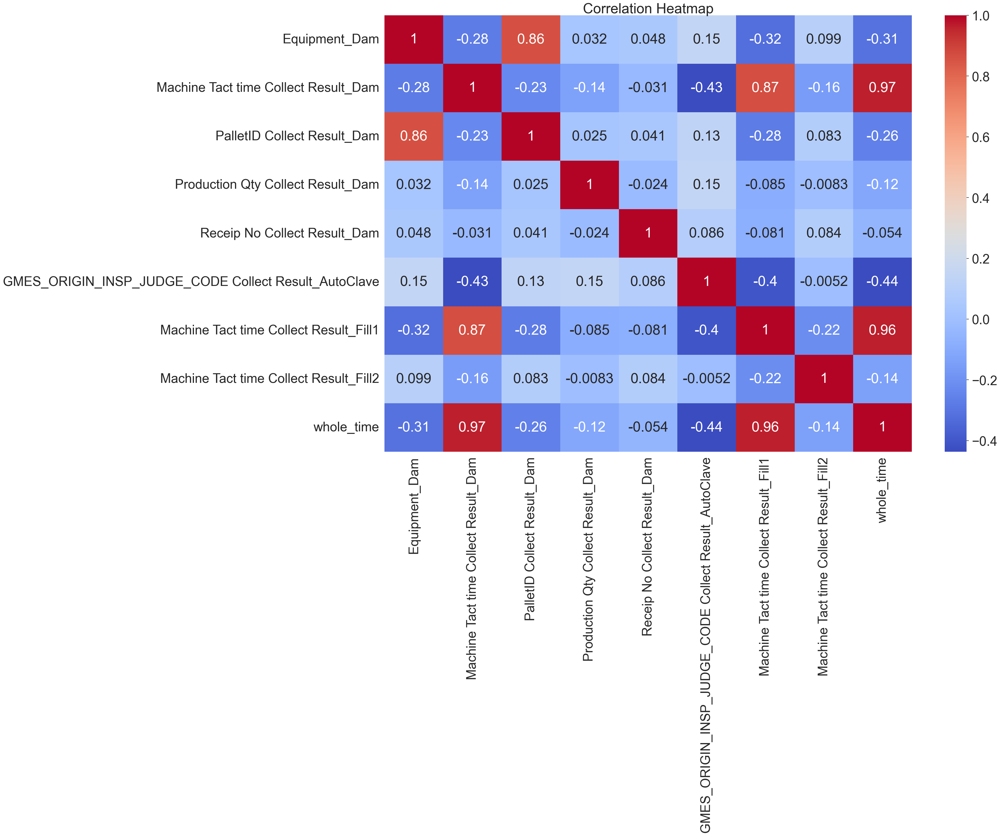

In [53]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=3)

heatmap = sns.heatmap(train_data[['Equipment_Dam',
         'Machine Tact time Collect Result_Dam',
         'PalletID Collect Result_Dam',
         'Production Qty Collect Result_Dam',
         'Receip No Collect Result_Dam',
         'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave',
         'Machine Tact time Collect Result_Fill1',
         'Machine Tact time Collect Result_Fill2',
                                 'whole_time']].corr(method='pearson'), 
                      annot=True, 
                      cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [54]:
for i in train_data['target'].value_counts():
    print(i/len(train_data['target']))

0.9441749975254875
0.05582500247451252


# CatBoost feature selection

In [55]:
# 데이터프레임에서 각 열별 NaN 개수 계산
nan_counts = train_data.isna().sum()

# 결과 출력
print("Number of NaNs in each column:")
for column_name, count in nan_counts.items():
    if count != 0:
        print(f"{column_name}: {count}")

Number of NaNs in each column:


In [147]:
# 범주형 확인
for i in train_data.columns:
    print(train_data[i].value_counts(), '\n')

Equipment_Dam
0    24968
1    15444
Name: count, dtype: int64 

Model.Suffix_Dam
AJX75334501    33741
AJX75334502     3382
AJX75334505     2630
AJX75334507      308
AJX75334503      162
AJX75334506      129
AJX75334508       60
Name: count, dtype: int64 

CURE SPEED Collect Result_Dam
70     34350
85      2208
100     2060
105     1635
95       159
Name: count, dtype: int64 

DISCHARGED SPEED OF RESIN Collect Result_Dam
10    20998
16    19410
15        4
Name: count, dtype: int64 

DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam
13.2    11188
21.3     6034
9.7      5430
17.0     4876
9.6      4443
14.9     3893
14.2     1313
14.7     1292
13.1      819
13.8      270
13.5      261
13.6      235
11.6      106
14.8       98
21.2       92
14.3       29
17.1       21
13.7       11
10.6        1
Name: count, dtype: int64 

DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam
4.9     10297
8.4      3570
3.9      3320
6.6      2686
8.3      2352
10.5     2179
8.1      2062
10.6     1821
8.

In [149]:
'''
def frequency_encoding(df, column):
    freq_encoding = df[column].value_counts(normalize=True)
    return df[column].map(freq_encoding)

# 기존 데이터프레임에 frequency encoding 결과를 새로운 열로 추가
train_data['Workorder_Dam'] = frequency_encoding(train_data, 'Workorder_Dam')
test_data['Workorder_Dam'] = frequency_encoding(test_data, 'Workorder_Dam')
'''

"\ndef frequency_encoding(df, column):\n    freq_encoding = df[column].value_counts(normalize=True)\n    return df[column].map(freq_encoding)\n\n# 기존 데이터프레임에 frequency encoding 결과를 새로운 열로 추가\ntrain_data['Workorder_Dam'] = frequency_encoding(train_data, 'Workorder_Dam')\ntest_data['Workorder_Dam'] = frequency_encoding(test_data, 'Workorder_Dam')\n"

In [56]:
cat_features = ['Model.Suffix_Dam',
               'Equipment_Dam',
               'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave',
               'char_2_Dam',
               'char_3_Dam', 'char_4_Dam', 'char_5_Dam', 'after_dash_Dam', 'Chamber Judge encoded_AutoClave']

# cat_features 리스트에 있는 모든 열의 값을 문자열로 변환
for col in cat_features:
    train_data[col] = train_data[col].astype(str)
    test_data[col] = test_data[col].astype(str)


In [57]:
y = train_data['target']
X = train_data.drop('target', axis=1)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

# 결과 확인
print(f"Train set: {train_X.shape}, {train_y.value_counts()}", '\n')
print(f"Test set: {test_X.shape}, {test_y.value_counts()}")

Train set: (32329, 78), target
Normal      30524
AbNormal     1805
Name: count, dtype: int64 

Test set: (8083, 78), target
Normal      7632
AbNormal     451
Name: count, dtype: int64


In [58]:
import optuna
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import f1_score, make_scorer


# StratifiedKFold 설정
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# F1 스코어를 위한 스코러 정의
f1_scorer = make_scorer(f1_score, average='macro')

# 학습 데이터와 검증 데이터로 분리
train_X_split, eval_X_split, train_y_split, eval_y_split = train_test_split(train_X, train_y, test_size=0.2, random_state=42, stratify=train_y)

# Objective 함수 정의
def objective(trial):
    # 하이퍼파라미터 공간 정의
    param = {
        'objective': 'Logloss',
        'eval_metric': 'F1',
        'iterations': trial.suggest_int('iterations', 100, 2000),
        'depth': trial.suggest_int('depth', 4, 16),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.002, 0.2),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.5, 1.0),
        'random_state': 42,
        'verbose': 0,
        'use_best_model': True,
        'auto_class_weights': 'Balanced',
        'cat_features': cat_features  # 자동으로 선택된 범주형 변수들
    }

    # CatBoostClassifier 모델 생성
    model = CatBoostClassifier(**param)

    # 모델 학습 및 검증
    model.fit(train_X_split, train_y_split, eval_set=(eval_X_split, eval_y_split), early_stopping_rounds=20)

    # 검증 세트에 대한 예측
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    
    return score

# Optuna Study 생성 및 최적화
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(),
                            pruner=optuna.pruners.HyperbandPruner())
study.optimize(objective, n_trials=50, n_jobs = -1)

# 최적의 파라미터 출력
print("최적의 파라미터:", study.best_params)

# 최적의 파라미터로 모델 생성
best_params = study.best_params
best_model = CatBoostClassifier(**best_params, cat_features=cat_features)

# 최종 모델 학습
best_model.fit(train_X, train_y)


[I 2024-08-30 07:49:00,143] A new study created in memory with name: no-name-ed0a706b-7095-4e93-8b13-e05cc0f2a701
[I 2024-08-30 07:49:11,008] Trial 1 finished with value: 0.5046495456527632 and parameters: {'iterations': 264, 'depth': 5, 'learning_rate': 0.13650412115169025, 'l2_leaf_reg': 6.63804866636628, 'subsample': 0.8073851593145047, 'colsample_bylevel': 0.5523715420708167}. Best is trial 1 with value: 0.5046495456527632.
[I 2024-08-30 07:49:13,740] Trial 10 finished with value: 0.5016436543510943 and parameters: {'iterations': 1917, 'depth': 7, 'learning_rate': 0.07387889605225924, 'l2_leaf_reg': 1.6186354375551701, 'subsample': 0.8592633040701086, 'colsample_bylevel': 0.5561458538760684}. Best is trial 1 with value: 0.5046495456527632.
[I 2024-08-30 07:49:14,809] Trial 5 finished with value: 0.49628362698374834 and parameters: {'iterations': 358, 'depth': 5, 'learning_rate': 0.1145829767525967, 'l2_leaf_reg': 4.918208904620195, 'subsample': 0.6264332020785587, 'colsample_byleve

최적의 파라미터: {'iterations': 481, 'depth': 12, 'learning_rate': 0.09357779923028699, 'l2_leaf_reg': 4.993747102003472, 'subsample': 0.6567532523054815, 'colsample_bylevel': 0.8736440387529771}
0:	learn: 0.5792619	total: 327ms	remaining: 2m 36s
1:	learn: 0.4931359	total: 616ms	remaining: 2m 27s
2:	learn: 0.4286836	total: 975ms	remaining: 2m 35s
3:	learn: 0.3784489	total: 1.22s	remaining: 2m 25s
4:	learn: 0.3402683	total: 1.54s	remaining: 2m 26s
5:	learn: 0.3111195	total: 1.65s	remaining: 2m 10s
6:	learn: 0.2882772	total: 1.99s	remaining: 2m 14s
7:	learn: 0.2700719	total: 2.3s	remaining: 2m 16s
8:	learn: 0.2563698	total: 2.45s	remaining: 2m 8s
9:	learn: 0.2457238	total: 2.81s	remaining: 2m 12s
10:	learn: 0.2372393	total: 3.12s	remaining: 2m 13s
11:	learn: 0.2302700	total: 3.48s	remaining: 2m 15s
12:	learn: 0.2253349	total: 3.57s	remaining: 2m 8s
13:	learn: 0.2210681	total: 3.65s	remaining: 2m 1s
14:	learn: 0.2166483	total: 3.96s	remaining: 2m 3s
15:	learn: 0.2133250	total: 4.27s	remaining: 2

In [59]:
plt.rc('font', size=8)
shap_values = best_model.get_feature_importance(Pool(train_X_split, label=train_y_split, cat_features=cat_features), type="ShapValues")

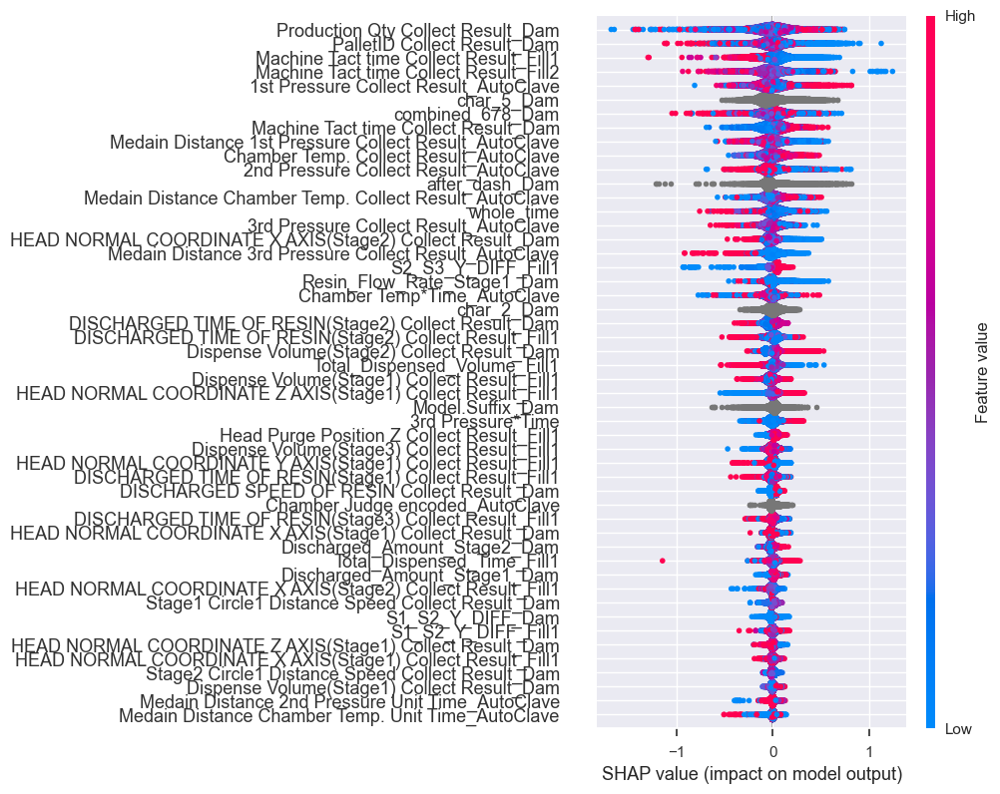

In [61]:
shap_values_no_bias = shap_values[:, :-1]
shap.summary_plot(shap_values_no_bias, train_X_split, max_display=50, plot_size=(10,8)) 

In [62]:
# SHAP 값을 DataFrame으로 변환 (bias 열 제외)
shap_values_df = pd.DataFrame(shap_values_no_bias, columns=train_X.columns)

# 변수 중요도 계산 (평균 절대값)
shap_importance = shap_values_df.abs().mean().sort_values(ascending=False)

# 상위 중요 변수와 그 SHAP 값 출력
for feature, importance in shap_importance.items():
    print(f'변수: {feature}, 중요도: {importance:.4f}')

변수: Production Qty Collect Result_Dam, 중요도: 0.1374
변수: PalletID Collect Result_Dam, 중요도: 0.1125
변수: Machine Tact time Collect Result_Fill1, 중요도: 0.1019
변수: Machine Tact time Collect Result_Fill2, 중요도: 0.1017
변수: 1st Pressure Collect Result_AutoClave, 중요도: 0.1001
변수: char_5_Dam, 중요도: 0.0982
변수: combined_678_Dam, 중요도: 0.0957
변수: Machine Tact time Collect Result_Dam, 중요도: 0.0927
변수: Medain Distance 1st Pressure Collect Result_AutoClave, 중요도: 0.0883
변수: Chamber Temp. Collect Result_AutoClave, 중요도: 0.0812
변수: 2nd Pressure Collect Result_AutoClave, 중요도: 0.0730
변수: after_dash_Dam, 중요도: 0.0726
변수: Medain Distance Chamber Temp. Collect Result_AutoClave, 중요도: 0.0716
변수: whole_time, 중요도: 0.0696
변수: 3rd Pressure Collect Result_AutoClave, 중요도: 0.0620
변수: HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam, 중요도: 0.0538
변수: Medain Distance 3rd Pressure Collect Result_AutoClave, 중요도: 0.0537
변수: S2_S3_Y_DIFF_Fill1, 중요도: 0.0521
변수: Resin_Flow_Rate_Stage1_Dam, 중요도: 0.0517
변수: Chamber Temp*Time_AutoC

In [63]:
# 중요도 0.05 이상인 변수 선택
important_features = shap_importance[shap_importance >= 0.05].index

# 새로운 데이터프레임 생성 (중요한 변수만 포함)
selected_train = train_data[important_features]
selected_test = test_data[important_features]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

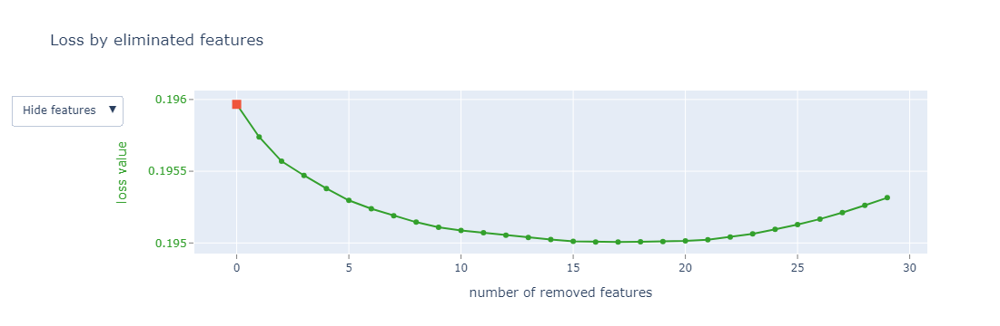

InvalidIndexError: (slice(None, None, None), ['Model.Suffix_Dam'])

In [64]:
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

# F1 스코어를 저장할 리스트
f1_scores = []

train_pool = Pool(train_X_split, train_y_split, cat_features=cat_features)
val_pool = Pool(eval_X_split, eval_y_split, cat_features=cat_features)

FS = best_model.select_features(
        train_pool,
        eval_set=val_pool,
        features_for_select=list(range(train_pool.num_col())),
        num_features_to_select=49,
        steps=1,
        algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues,
        shap_calc_type=EShapCalcType.Approximate,
        logging_level='Silent',
        train_final_model=False,
        plot=True
    )

selected_features = FS['selected_features_names']

# 선택된 피처로 모델 학습 및 F1 점수 계산
for i in range(1, len(selected_features) + 1):
    # 선택된 피처의 하위 집합으로 학습
    current_features = selected_features[:i]
    train_X_subset = train_X_split[:, current_features]
    val_X_subset = eval_X_split[:, current_features]
    
    # 모델 학습
    best_model.fit(train_X_subset, train_y_split, eval_set=(val_X_subset, eval_y_split), verbose=0)
    
    # 검증 세트 예측
    pred_y = best_model.predict(val_X_subset)
    
    # F1 점수 계산
    f1 = f1_score(eval_y_split, pred_y, average='macro')
    f1_scores.append(f1)

# F1 점수 시각화
plt.plot(range(1, len(selected_features) + 1), f1_scores, marker='o')
plt.xlabel('Number of Selected Features')
plt.ylabel('F1 Score')
plt.title('F1 Score by Number of Selected Features')
plt.show()

print('Selected features:', selected_features)


In [ ]:
print('Selected features:', FS['selected_features_names'])

In [ ]:
selected_train_data = train_data[train_data.columns[FS['selected_features']]]
selected_test_data = test_data[train_data.columns[FS['selected_features']]]

In [ ]:
import os
os.cpu_count()


In [ ]:
import optuna
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import f1_score, make_scorer
from sklearn.ensemble import VotingClassifier
from lightgbm import early_stopping

selected_train_data = selected_train_data.apply(lambda x: x.astype('category') if x.dtype == 'object' else x)
selected_test_data = selected_test_data.apply(lambda x: x.astype('category') if x.dtype == 'object' else x)

y = train_data['target']
y = y.map({'AbNormal': 1, 'Normal': 0})
X = selected_train_data

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

cat_features = [col for col in train_X.columns if train_X[col].dtype == 'object' or train_X[col].dtype.name == 'category']

# F1 스코어를 위한 스코러 정의
f1_scorer = make_scorer(f1_score, average='macro')

# 학습 데이터와 검증 데이터로 분리
train_X_split, eval_X_split, train_y_split, eval_y_split = train_test_split(train_X, train_y, test_size=0.2, random_state=42, stratify=train_y)



# CatBoost 파라미터 최적화와 모델 학습
def catboost_objective(trial):
    param = {
        'objective': 'Logloss',
        'eval_metric': 'F1',
        'iterations': trial.suggest_int('iterations', 100, 2000),
        'depth': trial.suggest_int('depth', 4, 16),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.002, 0.2),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.5, 1.0),
        'random_state': 42,
        'verbose': 0,
        'use_best_model': True,
        'auto_class_weights': 'Balanced',
        'cat_features': cat_features  # 자동으로 선택된 범주형 변수들
    }
    model = CatBoostClassifier(**param)
    model.fit(train_X_split, train_y_split, eval_set=(eval_X_split, eval_y_split), early_stopping_rounds=100)
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    return score

catboost_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(),
                                     pruner=optuna.pruners.HyperbandPruner())
catboost_study.optimize(catboost_objective, n_trials=50)
catboost_best_params = catboost_study.best_params
catboost_model = CatBoostClassifier(**catboost_best_params, cat_features=cat_features)
catboost_model.fit(train_X, train_y)


# XGBoost 파라미터 최적화와 모델 학습
def xgb_objective(trial):
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'n_estimators': trial.suggest_int('n_estimators', 100, 3000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.002, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'lambda': trial.suggest_float('lambda', 1e-8, 1.0, log=True),
        'alpha': trial.suggest_float('alpha', 1e-8, 1.0, log=True),
        'random_state': 42,
        'scale_pos_weight' : 17,
        'enable_categorical': True  # 범주형 변수 지원
    }
    model = XGBClassifier(**param)
    model.fit(train_X_split, train_y_split, eval_set=[(eval_X_split, eval_y_split)], early_stopping_rounds=10)
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    return score

xgb_study.optimize(xgb_objective, n_trials=50)
xgb_best_params = xgb_study.best_params
xgb_model = XGBClassifier(**xgb_best_params, enable_categorical=True)
xgb_model.fit(train_X, train_y)

# LightGBM 파라미터 최적화와 모델 학습
def lgb_objective(trial):
    param = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'n_estimators': trial.suggest_int('n_estimators', 100, 3000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'num_leaves': trial.suggest_int('num_leaves', 2, 2000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.002, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 1.0, log=True),  # lambda_l1을 reg_alpha로 변경
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 1.0, log=True),  # lambda_l2를 reg_lambda로 변경
        'random_state': 42,
        'is_unbalanced' : True
    }
    model = LGBMClassifier(**param)
    cat_features_idx = [train_X.columns.get_loc(col) for col in cat_features]
    early_stopping_cb = early_stopping(stopping_rounds=120, verbose=False)
    model.fit(train_X_split, train_y_split, eval_set=[(eval_X_split, eval_y_split)], 
              callbacks=[early_stopping_cb], eval_metric='binary_logloss', categorical_feature=cat_features_idx)
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    return score

lgb_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(),
                                pruner=optuna.pruners.HyperbandPruner())
lgb_study.optimize(lgb_objective, n_trials=50)
lgb_best_params = lgb_study.best_params
lgb_model = LGBMClassifier(**lgb_best_params)
lgb_model.fit(train_X, train_y)

# 세 모델의 소프트 보팅 앙상블
voting_clf = VotingClassifier(
    estimators=[('catboost', catboost_model), ('xgboost', xgb_model), ('lightgbm', lgb_model)],
    voting='soft'
)
voting_clf.fit(train_X, train_y)

# 예측
pred_y = voting_clf.predict(test_X)
pred_proba = voting_clf.predict_proba(test_X)


In [ ]:
from sklearn.metrics import f1_score
thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

test_y_n = test_y.map({1: 'AbNormal', 0: 'Normal'})
for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['Normal' if i[0] >= threshold else 'AbNormal' for i in pred_proba]
    
    
    # F1 스코어 계산
    f1 = f1_score(test_y_n, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

In [ ]:
len(pred_proba)

In [ ]:
# 이미지에 있는 인덱스들
special_indices = [562, 3457, 7287, 7836, 8253, 8898, 10989, 12439, 15180, 15406, 15811, 15964]

pred_proba_final = voting_clf.predict_proba(selected_test_data)

# 예측 결과를 기반으로 라벨 수정
y_pred = []
for idx, proba in enumerate(pred_proba_final):
    if idx in special_indices:
        if sub_data.loc[idx, 'target'] == 'AbNormal':
            print("Index", idx, "is already AbNormal, pass")
            y_pred.append('AbNormal')
        else:
            y_pred.append('AbNormal')
    else:
        y_pred.append('Normal' if proba[0] >= 0.94 else 'AbNormal')

# 수정된 결과를 CSV로 저장
sub_data['target'] = y_pred
sub_data.to_csv('submission.csv', index=False)


# SMOTE

In [78]:
변수: Production Qty Collect Result_Dam, 중요도: 0.2192
변수: Workorder_Dam, 중요도: 0.2056
변수: PalletID Collect Result_Dam, 중요도: 0.1940
변수: Machine Tact time Collect Result_Fill1, 중요도: 0.1822
변수: Machine Tact time Collect Result_Fill2, 중요도: 0.1707
변수: 1st Pressure Collect Result_AutoClave, 중요도: 0.1587
변수: combined_678_Dam, 중요도: 0.1574
변수: 2nd Pressure Collect Result_AutoClave, 중요도: 0.1510
변수: Medain Distance 1st Pressure Collect Result_AutoClave, 중요도: 0.1369
변수: Machine Tact time Collect Result_Dam, 중요도: 0.1340
변수: char_5_Dam, 중요도: 0.1174
변수: Chamber Temp*Time_AutoClave, 중요도: 0.1104
변수: Medain Distance Chamber Temp. Collect Result_AutoClave, 중요도: 0.1013
변수: Chamber Temp. Collect Result_AutoClave, 중요도: 0.1010
변수: Total_Dispensed_Volume_Fill1, 중요도: 0.0901
변수: HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1, 중요도: 0.0897
변수: char_2_Dam, 중요도: 0.0889
변수: 3rd Pressure Collect Result_AutoClave, 중요도: 0.0864
변수: after_dash_Dam, 중요도: 0.0860
변수: Medain Distance 3rd Pressure Collect Result_AutoClave, 중요도: 0.0852
변수: DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1, 중요도: 0.0826
변수: 2nd Pressure Unit Time_AutoClave, 중요도: 0.0816
변수: Model.Suffix_Dam, 중요도: 0.0723
변수: 3rd Pressure*Time, 중요도: 0.0705
변수: Resin_Flow_Rate_Stage1_Dam, 중요도: 0.0685
변수: Dispense Volume(Stage2) Collect Result_Dam, 중요도: 0.0675
변수: HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam, 중요도: 0.0639
변수: HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam, 중요도: 0.0580
변수: Discharged_Amount_Stage2_Dam, 중요도: 0.0579
변수: Dispense Volume(Stage3) Collect Result_Fill1, 중요도: 0.0553
변수: HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam, 중요도: 0.0541
변수: DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam, 중요도: 0.0516
변수: DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam, 중요도: 0.0509
변수: Dispense Volume(Stage1) Collect Result_Fill1, 중요도: 0.0492
변수: DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1, 중요도: 0.0484
변수: HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1, 중요도: 0.0455
변수: DISCHARGED SPEED OF RESIN Collect Result_Dam, 중요도: 0.0454
변수: DISCHARGED SPEED OF RESIN Collect Result_Fill1, 중요도: 0.0436
변수: DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1, 중요도: 0.0408
변수: HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1, 중요도: 0.0362
변수: HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1, 중요도: 0.0362
변수: CURE SPEED Collect Result_Dam, 중요도: 0.0360
변수: Sum_Thickness, 중요도: 0.0331
변수: Discharged_Amount_Stage1_Dam, 중요도: 0.0327
변수: Stage2 Circle1 Distance Speed Collect Result_Dam, 중요도: 0.0308
변수: Head Zero Position Y Collect Result_Dam, 중요도: 0.0305
변수: Medain Distance 2nd Pressure Unit Time_AutoClave, 중요도: 0.0274
변수: THICKNESS 3 Collect Result_Dam, 중요도: 0.0260
변수: CURE END POSITION Z Collect Result_Fill2, 중요도: 0.0249
변수: Head Zero Position Z Collect Result_Dam, 중요도: 0.0248
변수: Chamber Temp. Unit Time_AutoClave, 중요도: 0.0233
변수: Medain Distance Chamber Temp. Unit Time_AutoClave, 중요도: 0.0229
변수: Chamber Judge encoded_AutoClave, 중요도: 0.0215
변수: Stage1 Circle1 Distance Speed Collect Result_Dam, 중요도: 0.0174
변수: Dispense Volume(Stage1) Collect Result_Dam, 중요도: 0.0172
변수: Equipment_Dam, 중요도: 0.0163
변수: Receip No Collect Result_Dam, 중요도: 0.0160
변수: Head Purge Position Z Collect Result_Fill1, 중요도: 0.0151
변수: HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2, 중요도: 0.0132
변수: CURE SPEED Collect Result_Fill2, 중요도: 0.0118
변수: THICKNESS 1 Collect Result_Dam, 중요도: 0.0118
변수: THICKNESS 2 Collect Result_Dam, 중요도: 0.0087
변수: CURE STANDBY POSITION Z Collect Result_Fill2, 중요도: 0.0077
변수: 1st Pressure 1st Pressure Unit Time_AutoClave, 중요도: 0.0068
변수: Medain Distance 1st Pressure 1st Pressure Unit Time_AutoClave, 중요도: 0.0058
변수: GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave, 중요도: 0.0054
변수: Head Purge Position Z Collect Result_Dam, 중요도: 0.0047
변수: 3rd Pressure Unit Time_AutoClave, 중요도: 0.0044
변수: Medain Distance 3rd Pressure Unit Time_AutoClave, 중요도: 0.0036
변수: Head Purge Position Z Collect Result_Fill2, 중요도: 0.0029
변수: char_4_Dam, 중요도: 0.0023
변수: char_3_Dam, 중요도: 0.0000
변수: CURE END POSITION X Collect Result_Fill2, 중요도: 0.0000
변수: char_1_Dam, 중요도: 0.0000

['Workorder_Dam',
 'CURE SPEED Collect Result_Dam',
 'DISCHARGED SPEED OF RESIN Collect Result_Dam',
 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
 'Dispense Volume(Stage1) Collect Result_Dam',
 'Dispense Volume(Stage2) Collect Result_Dam',
 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
 'Head Zero Position Y Collect Result_Dam',
 'PalletID Collect Result_Dam',
 'Production Qty Collect Result_Dam',
 'Receip No Collect Result_Dam',
 'Stage1 Circle1 Distance Speed Collect Result_Dam',
 'THICKNESS 1 Collect Result_Dam',
 'THICKNESS 2 Collect Result_Dam',
 'THICKNESS 3 Collect Result_Dam',
 '1st Pressure Collect Result_AutoClave',
 '1st Pressure 1st Pressure Unit Time_AutoClave',
 '2nd Pressure Collect Result_AutoClave',
 '3rd Pressure Unit Time_AutoClave',
 'Chamber Temp. Collect Result_AutoClave',
 'Chamber Temp. Unit Time_AutoClave',
 'DISCHARGED S